# About AmEx Default Prediction

Credit default prediction is central to managing risk in a consumer lending business. Credit default prediction allows lenders to optimize lending decisions, which leads to a better customer experience and sound business economics. Current models exist to help manage risk. But it's possible to create better models that can outperform those currently in use.

# Problem Statement
The objective of this project is to predict the probability that a customer does not pay back their credit card balance amount in the future.

our task is to predict, if a customer will default in the future or not

In [1]:
!pip install scipy

In [2]:
!pip install termcolor

In [3]:
!pip install xgboost

# Import Libraries



In [4]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from matplotlib.colors import ListedColormap
import seaborn as sns
from scipy.stats import skew
from sklearn import preprocessing
import scipy.stats
from scipy.stats import chi2
from termcolor import colored, cprint
from scipy.stats import pearsonr
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import confusion_matrix, accuracy_score, precision_score, recall_score, f1_score
from xgboost import XGBClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC

from sklearn.ensemble import VotingClassifier ,BaggingClassifier, AdaBoostClassifier,GradientBoostingClassifier
from numpy import mean,std
import xgboost as xgb
from sklearn.feature_selection import SelectKBest,f_regression
from sklearn.base import BaseEstimator,clone,TransformerMixin,RegressorMixin

from sklearn.impute import SimpleImputer
from sklearn.preprocessing import PowerTransformer
from sklearn.model_selection import RepeatedStratifiedKFold,cross_val_score,RandomizedSearchCV,GridSearchCV
from pprint import pprint
from sklearn import tree
from imblearn.over_sampling import RandomOverSampler
from imblearn.under_sampling import RandomUnderSampler
# Stop warnings
import warnings
warnings.filterwarnings("ignore")

In [5]:
import numpy as np
# data processing, CSV file I/O
import pandas as pd
# data processing, CSV file I/O
import dask.dataframe as dd
# module finds all the pathnames matching a specified pattern
import glob
import os
# importing pyplot interface using matplotlib
import matplotlib.pyplot as plt
# importing seaborn library for interactive visualization
import seaborn as sns
# Importing WordCloud for text data visualization
from wordcloud import WordCloud
# importing matplotlib for plots
import matplotlib
# importing datetime for using datetime
from datetime import datetime
# importing plotly for interactive plots
import plotly.express as px
# importing missingno for missing value plot

# import missingno as msno
# importing regex library for use of regex
import re
# importing Counter for counting :)
from collections import Counter

import plotly.graph_objs as go

In [6]:
# importing SimpleImputer for handling missing value
from sklearn.impute import SimpleImputer
# importing MissingIndicator for handling missing value
from sklearn.impute import MissingIndicator
# importing StandardScaler for standardization
from sklearn.preprocessing import StandardScaler
# importing OnHotEncoder for encoding categorical variable
from sklearn.preprocessing import OneHotEncoder
# importing for transformation
from sklearn.compose import ColumnTransformer
from sklearn.compose import make_column_transformer
from sklearn.compose import make_column_selector
# importing PCA for handling dimensonality reduction
from sklearn.decomposition import PCA

# importing pipeline for chaining model building activities
#from sklearn.pipeline import Pipeline
#from sklearn.pipeline import make_pipeline
from imblearn.pipeline import Pipeline
from imblearn.pipeline import make_pipeline as mp
# importing FeatureUnion for combining transformers
from sklearn.pipeline import FeatureUnion

# importing samplers for handling data imbalance
from imblearn.combine import SMOTEENN
from imblearn.over_sampling import SMOTE
from imblearn.over_sampling import RandomOverSampler
from imblearn.under_sampling import RandomUnderSampler

# importing train_test_split for train and validation split
from sklearn.model_selection import train_test_split
# importing SelectFromModel to select features from model
from sklearn.feature_selection import SelectFromModel

In [7]:
# importing classifiers to try with
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.ensemble import GradientBoostingClassifier
# from xgboost import XGBClassifier


# importing metrics required for model evaluation
from sklearn.metrics import accuracy_score
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score
from sklearn.metrics import f1_score
from sklearn.metrics import classification_report
from sklearn.metrics import make_scorer
from sklearn.metrics import confusion_matrix
from sklearn.metrics import ConfusionMatrixDisplay

# importing RepeatedKFold for cross validation
from sklearn.model_selection import RepeatedKFold
# importing for model evaluation
from sklearn.model_selection import cross_validate
from sklearn.model_selection import cross_val_predict
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import validation_curve
# importing RepeatedStratifiedKFold for model evaluation
from sklearn.model_selection import RepeatedStratifiedKFold
# importing GridSearchCV for hyperparameter tuning
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import RandomizedSearchCV
from itertools import cycle

import warnings, gc
warnings.filterwarnings('ignore')

# . Importing the Dataset

In [8]:
df_train = pd.read_feather('train_data.ftr')
df_train = df_train.groupby('customer_ID').tail(1).set_index('customer_ID')

df_subm = pd.read_csv("sample_submission.csv")

# Header information of Data

In [9]:
df_train.head()

,S_2,P_2,D_39,B_1,B_2,R_1,S_3,D_41,B_3,D_42,...,D_137,D_138,D_139,D_140,D_141,D_142,D_143,D_144,D_145,target
customer_ID,,,,,,,,,,,,,,,,,,,,,
0000099d6bd597052cdcda90ffabf56573fe9d7c79be5fbac11a8ed792feb62a,2018-03-13,0.934570,0.009117,0.009384,1.007812,0.006104,0.135010,0.001604,0.007175,NaN,...,NaN,NaN,0.007187,0.004234,0.005085,NaN,0.005810,0.002970,0.008530,0
00000fd6641609c6ece5454664794f0340ad84dddce9a267a310b5ae68e9d8e5,2018-03-25,0.880371,0.178101,0.034698,1.003906,0.006912,0.165527,0.005550,0.005070,NaN,...,NaN,NaN,0.002981,0.007481,0.007874,NaN,0.003284,0.003170,0.008514,0
00001b22f846c82c51f6e3958ccd81970162bae8b007e80662ef27519fcc18c1,2018-03-12,0.880859,0.009705,0.004284,0.812500,0.006451,NaN,0.003796,0.007195,NaN,...,NaN,NaN,0.007381,0.006622,0.000965,NaN,0.002201,0.000834,0.003445,0
000041bdba6ecadd89a52d11886e8eaaec9325906c9723355abb5ca523658edc,2018-03-29,0.621582,0.001082,0.012566,1.005859,0.007828,0.287842,0.004532,0.009941,NaN,...,NaN,NaN,0.002705,0.006184,0.001899,NaN,0.008186,0.005558,0.002983,0
00007889e4fcd2614b6cbe7f8f3d2e5c728eca32d9eb8ad51ca8b8c4a24cefed,2018-03-30,0.872070,0.005573,0.007679,0.815918,0.001247,NaN,0.000231,0.005527,NaN,...,NaN,NaN,0.002974,0.004162,0.005764,NaN,0.008156,0.006943,0.000905,0


In [10]:
df_train.tail()

,S_2,P_2,D_39,B_1,B_2,R_1,S_3,D_41,B_3,D_42,...,D_137,D_138,D_139,D_140,D_141,D_142,D_143,D_144,D_145,target
customer_ID,,,,,,,,,,,,,,,,,,,,,
ffff41c8a52833b56430603969b9ca48d208e7c192c6a4081a6acc28cf4f8af7,2018-03-31,0.844238,0.447510,0.028519,1.009766,0.001928,0.128662,0.003483,0.005894,NaN,...,NaN,NaN,0.007919,0.001519,0.005531,NaN,0.001431,0.003010,0.004845,0
ffff518bb2075e4816ee3fe9f3b152c57fc0e6f01bf7fdd3e5b57cfcbee30286,2018-03-22,0.831055,0.033661,0.292480,0.055664,0.006954,NaN,0.005791,0.233032,NaN,...,NaN,NaN,0.004395,0.006184,0.001479,NaN,0.004795,0.009232,0.006435,0
ffff9984b999fccb2b6127635ed0736dda94e544e67e026eee4d20f680639ff6,2018-03-07,0.800293,0.267090,0.020569,1.006836,0.000957,0.066650,0.007423,0.006313,NaN,...,NaN,NaN,0.006035,0.002869,0.002150,NaN,0.008034,0.000340,0.002148,0
ffffa5c46bc8de74f5a4554e74e239c8dee6b9baf388145b2c3d01967fcce461,2018-03-23,0.753906,0.008621,0.015839,0.714355,0.000993,0.408936,0.003391,0.050049,NaN,...,NaN,NaN,1.009766,0.004478,0.949707,0.446289,1.009766,0.002502,0.185547,1
fffff1d38b785cef84adeace64f8f83db3a0c31e8d92eaba8b115f71cab04681,2018-03-14,0.981934,0.002474,0.000077,0.992676,0.000809,0.119141,0.003286,0.014091,NaN,...,NaN,NaN,0.007317,0.002888,0.006207,NaN,0.005112,0.003183,0.001914,0


In [11]:
df_train.shape

(458913, 190)

### Count of target variable

In [12]:
df_train['target'].value_counts()

0    340085
1    118828
Name: target, dtype: int64

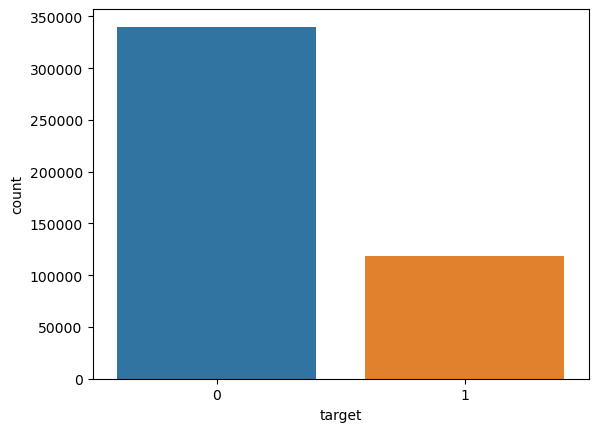

In [13]:
sns.countplot(x=df_train['target'])
plt.show()

### to address class imbalance in the dataset we did downsampling and upsampling

In [14]:
import pandas as pd
from sklearn.utils import resample

# Assume df is your DataFrame and 'class' is the target variable
# df = pd.read_csv('your_data.csv')

# Separate majority and minority classes
df_majority = df_train[df_train['target'] == 0] # Replace 0 with your majority class label
df_minority = df_train[df_train['target'] == 1] # Replace 1 with your minority class label

# Downsample majority class
df_majority_downsampled = resample(df_majority,
                                   replace=False,    # sample without replacement
                                   n_samples=len(df_minority), # to match minority class
                                   random_state=123) # reproducible results

# Combine minority class with downsampled majority class
df_downsampled = pd.concat([df_majority_downsampled, df_minority])

# Display new class counts
print(df_downsampled['target'].value_counts())

0    118828
1    118828
Name: target, dtype: int64


In [15]:
df_minority_upsampled = resample(df_minority,
                                 replace=True,     # sample with replacement
                                 n_samples=len(df_majority), # to match majority class
                                 random_state=123) # reproducible results

# Combine majority class with upsampled minority class
df_upsampled = pd.concat([df_majority, df_minority_upsampled])
print(df_upsampled['target'].value_counts())

0    340085
1    340085
Name: target, dtype: int64


In [16]:
df_train=df_train.groupby("target").sample(n=5000)

In [17]:
# number of rows and columns

newdf_row_count, newdf_column_count = df_train.shape
print('Total number of rows (Train):', newdf_row_count)
print('Total number of columns (Train):',newdf_column_count)

Total number of rows (Train): 10000
Total number of columns (Train): 190


In [18]:
# removing duplicated values
# contains 0 duplicated values

df_train.duplicated().sum()

0

## Missing value information in the dataset
here we printed list of attribute columns that have missing values, along with the number of missing values for each attribute

In [19]:
#  dealing with missing data

MS_Data = df_train.isna().sum()
MS_Values = MS_Data.values
MS_Keys = MS_Data.keys()
print(f'Attribute Column       Number of Missing values:')
for i in range(len(MS_Values)):
    V = MS_Values[i]
    if V>0:
        Keys_Missing = MS_Keys[i]
        print(f'      {Keys_Missing}                      {V}')

Attribute Column       Number of Missing values:
      P_2                      61
      B_2                      1
      S_3                      1511
      D_41                      1
      B_3                      1
      D_42                      8343
      D_43                      2513
      D_44                      480
      D_45                      1
      D_46                      1845
      D_48                      1013
      D_49                      8467
      B_6                      1
      B_8                      110
      D_50                      6077
      D_52                      28
      P_3                      553
      D_53                      6169
      D_54                      1
      S_7                      1511
      D_55                      574
      D_56                      5891
      B_13                      38
      S_9                      3942
      D_59                      94
      D_61                      809
      B_15                   

## Handling missing value
this code is addressing missing values in 'float64' columns by first converting 'float16' columns to 'float64' for better precision, filling missing values in 'float64' columns with a placeholder value (-1), and then replacing that placeholder value with the calculated column averages(mean)

In [20]:
#  handling missing values using mean strategy


column_averages = {}

for column in df_train.columns:
    if df_train[column].dtype == 'float16':
        df_train[column] = df_train[column].astype('float64')
        column_averages[column] = df_train[column].mean()
#         df_train[column] = df_train[column].astype('float16')


excluded_types = ['category', 'object']

# Iterate through the DataFrame's columns
for column in df_train.columns:
    if df_train[column].dtype == 'float64' and column not in excluded_types:
        df_train[column] = df_train[column].fillna(-1)


for column, avg in column_averages.items():
    if df_train[column].dtype not in excluded_types:
        df_train[column] = df_train[column].replace(-1, avg)


Notice - Models like decision tree classifiers can handle missing data by themselves
         Here, we have still imputed missing values using mean strategy for numerical data

In [21]:
# checking again for missing values

MS_Data = df_train.isna().sum()
MS_Values = MS_Data.values
MS_Keys = MS_Data.keys()
print(f'Attribute Column       Number of Missing values:')
for i in range(len(MS_Values)):
    V = MS_Values[i]
    if V>0:
        Keys_Missing = MS_Keys[i]
        print(f'      {Keys_Missing}                      {V}')

Attribute Column       Number of Missing values:
      D_66                      8962
      D_68                      223
      B_30                      1
      B_38                      1
      D_114                      148
      D_116                      148
      D_117                      148
      D_120                      148


### handle missing value of categorical variable with the help of mode

In [22]:
str_cols = ['D_114', 'D_116', 'D_117', 'D_120', 'D_66', 'D_68']

for col in str_cols:
    mode_value = df_train[col].mode()[0]
    df_train[col].fillna(mode_value, inplace=True)

In [23]:
MS_Data = df_train.isna().sum()
MS_Values = MS_Data.values
MS_Keys = MS_Data.keys()
print(f'Attribute Column       Number of Missing values:')
for i in range(len(MS_Values)):
    V = MS_Values[i]
    if V>0:
        Keys_Missing = MS_Keys[i]
        print(f'      {Keys_Missing}                      {V}')

Attribute Column       Number of Missing values:
      B_30                      1
      B_38                      1


No **missing values** left

In [24]:
df_train.describe()

,P_2,D_39,B_1,B_2,R_1,S_3,D_41,B_3,D_42,D_43,...,D_137,D_138,D_139,D_140,D_141,D_142,D_143,D_144,D_145,target
count,10000.000000,1.000000e+04,10000.000000,10000.000000,10000.000000,10000.000000,1.000000e+04,10000.000000,10000.000000,10000.000000,...,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,1.000000e+04,10000.000000
mean,0.536220,2.848670e-01,0.195507,0.467923,0.185956,0.267664,1.678390e-01,0.220803,0.218749,0.199236,...,0.012366,0.156352,0.206478,0.042201,0.189649,0.402223,0.206314,0.050774,7.782094e-02,0.500000
std,0.290771,5.230639e-01,0.270662,0.427524,0.366043,0.206479,4.045707e-01,0.288331,0.115132,0.225145,...,0.019944,0.059289,0.399803,0.189302,0.367062,0.114475,0.399694,0.178402,2.219307e-01,0.500025
min,-0.458984,5.364418e-07,-0.014671,0.000026,0.000007,-0.361816,1.788139e-07,0.000005,0.001390,0.000045,...,0.000016,0.000077,0.000000,0.000002,0.000002,-0.009621,0.000006,0.000001,8.344650e-07,0.000000
25%,0.333252,5.661011e-03,0.014374,0.034554,0.003309,0.149658,3.355026e-03,0.007061,0.218749,0.069626,...,0.012366,0.156352,0.003133,0.002579,0.003250,0.402223,0.003193,0.002790,3.093719e-03,0.000000
50%,0.534180,3.346252e-02,0.076294,0.314453,0.006744,0.209473,6.725311e-03,0.069916,0.218749,0.186523,...,0.012366,0.156352,0.006256,0.005150,0.006355,0.402223,0.006271,0.005533,6.290436e-03,0.500000
75%,0.797852,3.621216e-01,0.267883,0.819824,0.251953,0.295898,9.971619e-03,0.363770,0.218749,0.199236,...,0.012366,0.156352,0.009438,0.007812,0.009438,0.402223,0.009392,0.008242,9.445190e-03,1.000000
max,1.009766,3.974609e+00,1.323242,1.009766,2.759766,2.451172,6.472656e+00,1.474609,3.890625,3.384766,...,1.009766,1.504883,1.009766,1.009766,1.339844,2.228516,1.009766,1.342773,3.183594e+00,1.000000


In [25]:
# categorical columns/features

cat_cols = ['B_30', 'B_38', 'D_114', 'D_116', 'D_117', 'D_120', 'D_126', 'D_63', 'D_64', 'D_66', 'D_68']
print(f"There are {df_train.shape[1]} features in the data. {len(cat_cols)} of them are categorical features.")

There are 190 features in the data. 11 of them are categorical features.


In [26]:
print(f"Out of the {df_train.shape[0]} customers, {df_train['target'].value_counts().iloc[1]} customers have defaulted.")

Out of the 10000 customers, 5000 customers have defaulted.


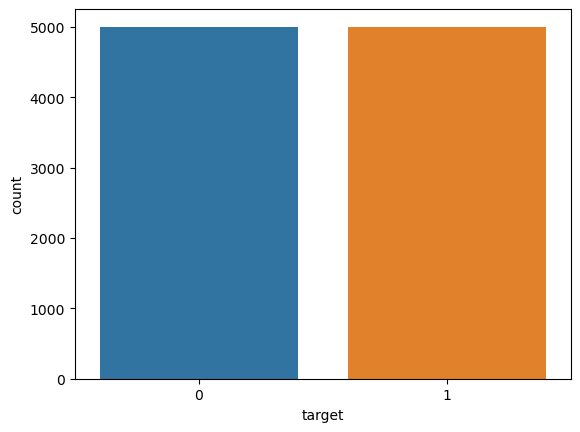

In [27]:
# count plot shows equal values

sns.countplot(x=df_train.target)
plt.show()

## Analyzing all features that are anonymized and normalized, and fall into the following general categories:

-  __D___ = Delinquency variables
- __S___ = Spend variables
- __P___ = Payment variables
- __B___ = Balance variables
- __R___ = Risk variables


In [28]:
# frequency of each - [D = Delinquency, S = Spend, P = Payment, B = Balance, R = Risk]

feat_Delinquency = [c for c in df_train.columns if c.startswith('D_')]
feat_Spend = [c for c in df_train.columns if c.startswith('S_')]
feat_Payment = [c for c in df_train.columns if c.startswith('P_')]
feat_Balance = [c for c in df_train.columns if c.startswith('B_')]
feat_Risk = [c for c in df_train.columns if c.startswith('R_')]
print(f'Total number of Delinquency variables: {len(feat_Delinquency)}')
print(f'Total number of Spend variables: {len(feat_Spend)}')
print(f'Total number of Payment variables: {len(feat_Payment)}')
print(f'Total number of Balance variables: {len(feat_Balance)}')
print(f'Total number of Risk variables: {len(feat_Risk)}')

Total number of Delinquency variables: 96
Total number of Spend variables: 22
Total number of Payment variables: 3
Total number of Balance variables: 40
Total number of Risk variables: 28


In [29]:
# creating list labels

labels=['Delinquency', 'Spend','Payment','Balance','Risk']
values= [len(feat_Delinquency), len(feat_Spend),len(feat_Payment), len(feat_Balance),len(feat_Risk)]

In [30]:
fig_1 = go.Figure()
fig_1.add_trace(go.Pie(values = values,labels = labels,hole = 0.6,
                     hoverinfo ='label+percent'))
fig_1.update_traces(textfont_size = 12, hoverinfo ='label+percent',textinfo ='label',
                  showlegend = False,marker = dict(colors =["#70d6ff","#ff9770"]),
                  title = dict(text = 'Feature Distribution'))
fig_1.show()

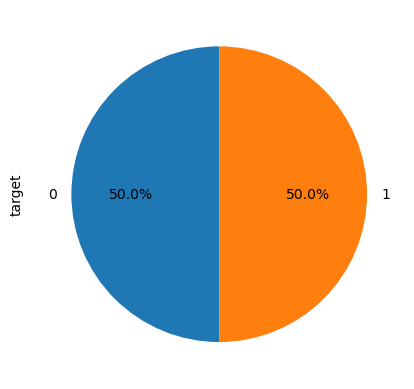

In [31]:
# pie chart representing percentage of customers who defaulted and paid

df_train['target'].value_counts().plot(kind = 'pie',autopct='%1.1f%%', startangle=90)
plt.show()

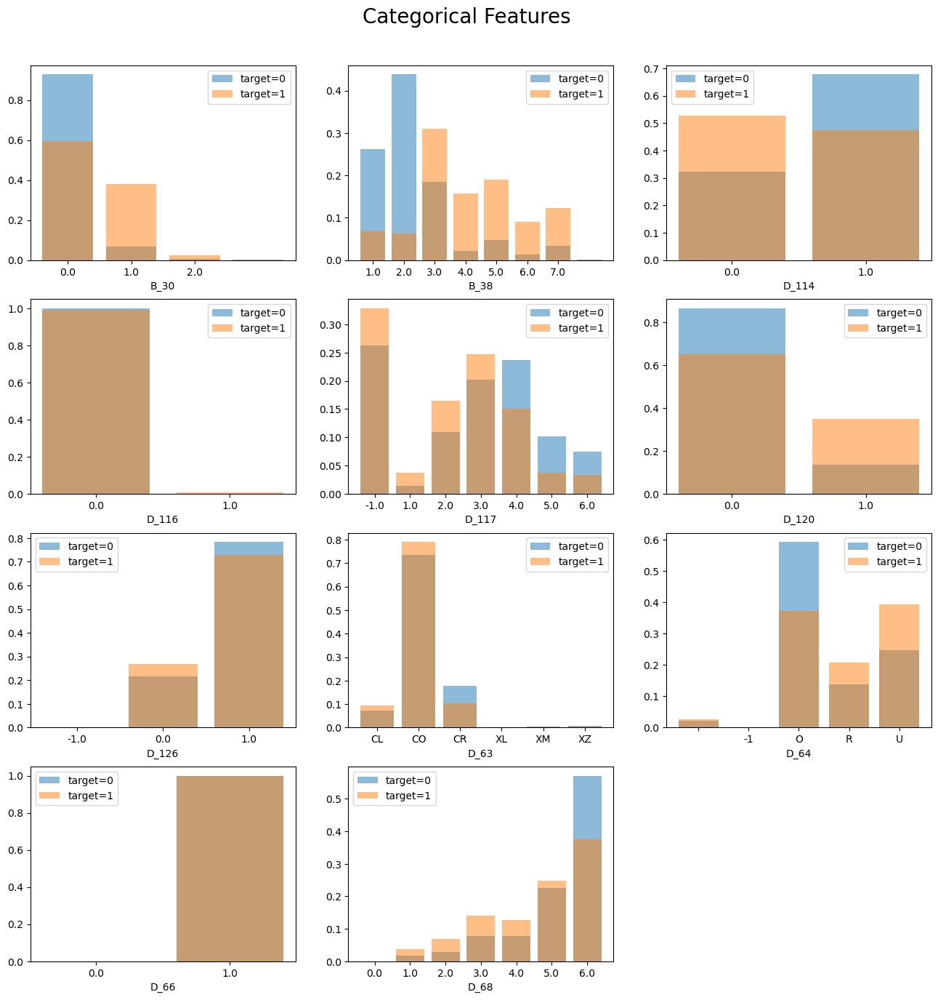

In [32]:
# histogram showing distribution of categorical features

plt.figure(figsize=(16, 16))
for i, f in enumerate(cat_cols):
    plt.subplot(4, 3, i+1)
    temp = pd.DataFrame(df_train[f][df_train.target == 0].value_counts(dropna=False, normalize=True).sort_index().rename('count'))
    temp.index.name = 'value'
    temp.reset_index(inplace=True)
    plt.bar(temp.index, temp['count'], alpha=0.5, label='target=0')
    temp = pd.DataFrame(df_train[f][df_train.target == 1].value_counts(dropna=False, normalize=True).sort_index().rename('count'))
    temp.index.name = 'value'
    temp.reset_index(inplace=True)
    plt.bar(temp.index, temp['count'], alpha=0.5, label='target=1')
    plt.xlabel(f)
    plt.legend()
    plt.xticks(temp.index, temp.value)
plt.suptitle('Categorical Features', fontsize=20, y=0.93)
plt.show()
del temp

#### Key Insights:

- Every categorical feature has at most eight categories.

- The following features are binary (they only take values of 0, 1 or missing): D_114, D_116, D_120, D_66.

### Delinquency features

In [33]:
print(f"Number of delinquency features: {len([f for f in df_train.columns if (f not in  ['customer_ID', 'target', 'S_2']) and (f.startswith(('D')))])}")

delin_features = sorted([f for f in df_train.columns if (f not in cat_cols + ['customer_ID', 'target', 'S_2']) and (f.startswith(('D')))])
print(f"Number of numerical delinquency features: {len(delin_features)}")

Number of delinquency features: 96
Number of numerical delinquency features: 87


In [34]:
#  box plot showing distribution of delinquency features

def plot_boxplots(features, title):
    # Filter numeric columns
    numeric_features = df_train[features].select_dtypes(include=['float64', 'int64']).columns

    # Calculate the number of rows needed for subplots
    rows = int(len(numeric_features) / 4) + (1 if len(numeric_features) % 4 != 0 else 0)

    # Create subplots
    fig, axs = plt.subplots(rows, 4, figsize=(15, 3 * rows))

    plt.suptitle(f'\n{title}', fontsize=20, y=1)

    for i, f in enumerate(numeric_features):
        row = i // 4
        col = i % 4
        ax = axs[row, col] if rows > 1 else axs[col]

        sns.boxplot(data=df_train, x=f, ax=ax)
        ax.set_title(f)

    # Hide empty subplots
    for i in range(len(numeric_features), rows * 4):
        axs.flatten()[i].set_visible(False)

    plt.tight_layout()
    plt.show()


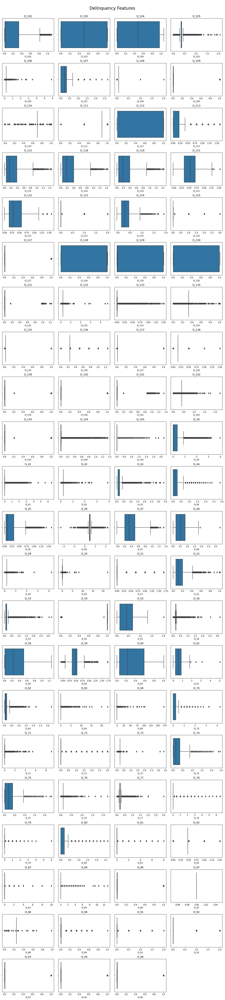

In [35]:
plot_boxplots(delin_features, 'Delinquency Features')

In [36]:
# delinquency columns

cols=[col for col in df_train.columns if (col.startswith(('D','t'))) & (col not in cat_cols)]

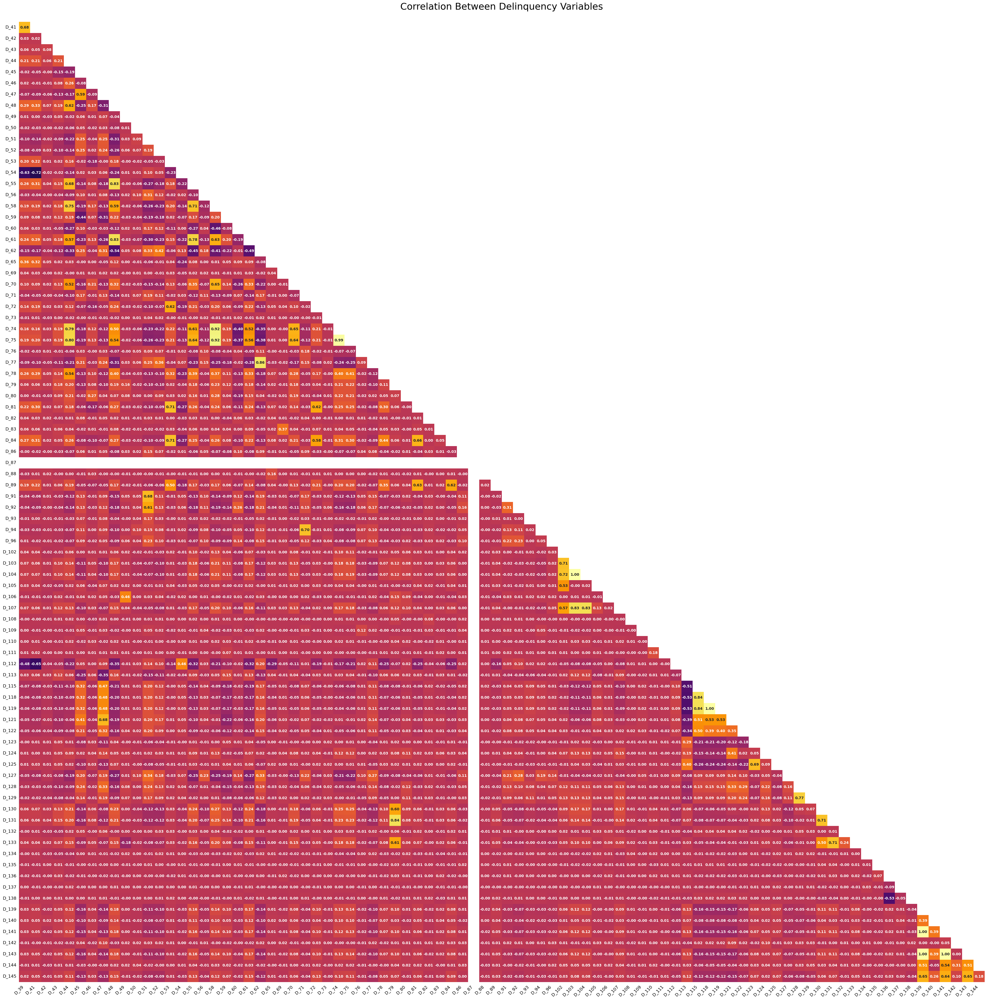

In [37]:
# heatmap

def plot_corr_heatmap(features, title):

    corr=df_train[features].iloc[:,:-1].corr()

    mask=np.triu(np.ones_like(corr, dtype=bool))[1:,:-1]
    corr=corr.iloc[1:,:-1].copy()

    fig, ax = plt.subplots(figsize=(48,48))
    sns.heatmap(corr, mask=mask, vmin=-1, vmax=1, center=0, annot=True, fmt='.2f', cmap='inferno', annot_kws={'fontsize':10,'fontweight':'bold'}, cbar=False)

    ax.tick_params(left=False,bottom=False)
    ax.set_xticklabels(ax.get_xticklabels(), rotation=45, horizontalalignment='right',fontsize=12)
    ax.set_yticklabels(ax.get_yticklabels(), fontsize=12)

    plt.title(f'{title}\n', fontsize=26)
    fig.show()


plot_corr_heatmap(cols, 'Correlation Between Delinquency Variables')

In [38]:
# delinquency columns with very high correlation

cols=[col for col in df_train.columns if (col.startswith(('D','t'))) & (col not in cat_cols)]
corr=df_train[cols].iloc[:,:-1].corr()
np.fill_diagonal(corr.values, 0.0)
mask = np.triu(np.ones_like(corr, dtype=bool))
corr = corr.mask(mask)
highly_correlated_features = corr[np.abs(corr) > 0.9].stack().reset_index()
highly_correlated_features=highly_correlated_features.iloc[abs(highly_correlated_features[0]).argsort()[::-1]].reset_index()
highly_correlated_features

,index,level_0,level_1,0
0,3,D_104,D_103,0.999735
1,6,D_143,D_139,0.999320
2,5,D_141,D_139,0.997862
3,7,D_143,D_141,0.997202
4,4,D_119,D_118,0.996260
5,2,D_75,D_74,0.988429
6,1,D_75,D_58,0.924673
7,0,D_74,D_58,0.917436


#### Key Insights:

- If the two distributions (default vs. paid) are very separate for a feature, it shows that the feature could have useful information about the target and should be used in prediction.

- For some of the features such as D_134, D_121, etc., the distribution for bad customers is similar in shape to the distribution of good customers, but the distribution is shifted up or down in the y axis. This may show similar overall behavioral pattern for good and bad customers. The shift in the scale of the distribution could show that the scale of the behavior (such as amount spent) is different for the two groups

### Spend features

In [39]:
# spend columns

spend_features = sorted([f for f in df_train.columns if (f not in ['customer_ID', 'target', 'S_2']) and (f.startswith(('S')))])

In [40]:
print(f"Number of spend features: {len(spend_features)}")
print(f"Number of numerical spend features: {len([f for f in spend_features if f not in cat_cols])}")

Number of spend features: 21
Number of numerical spend features: 21


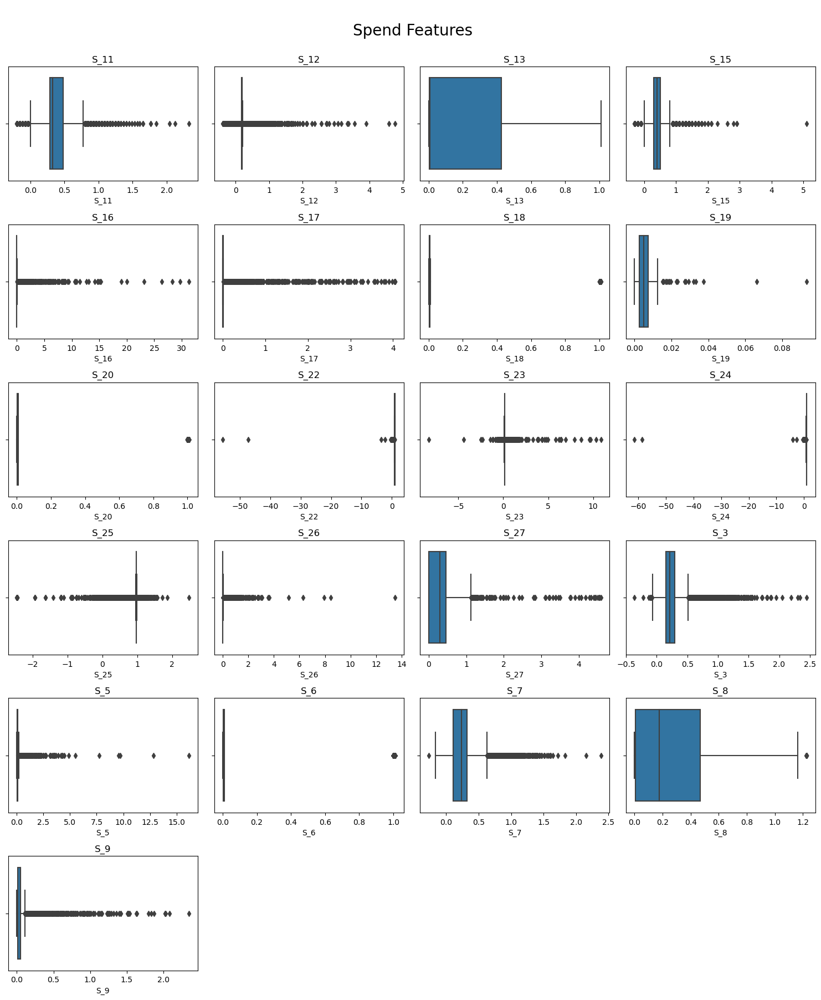

In [41]:
# box plot

plot_boxplots(spend_features, 'Spend Features')

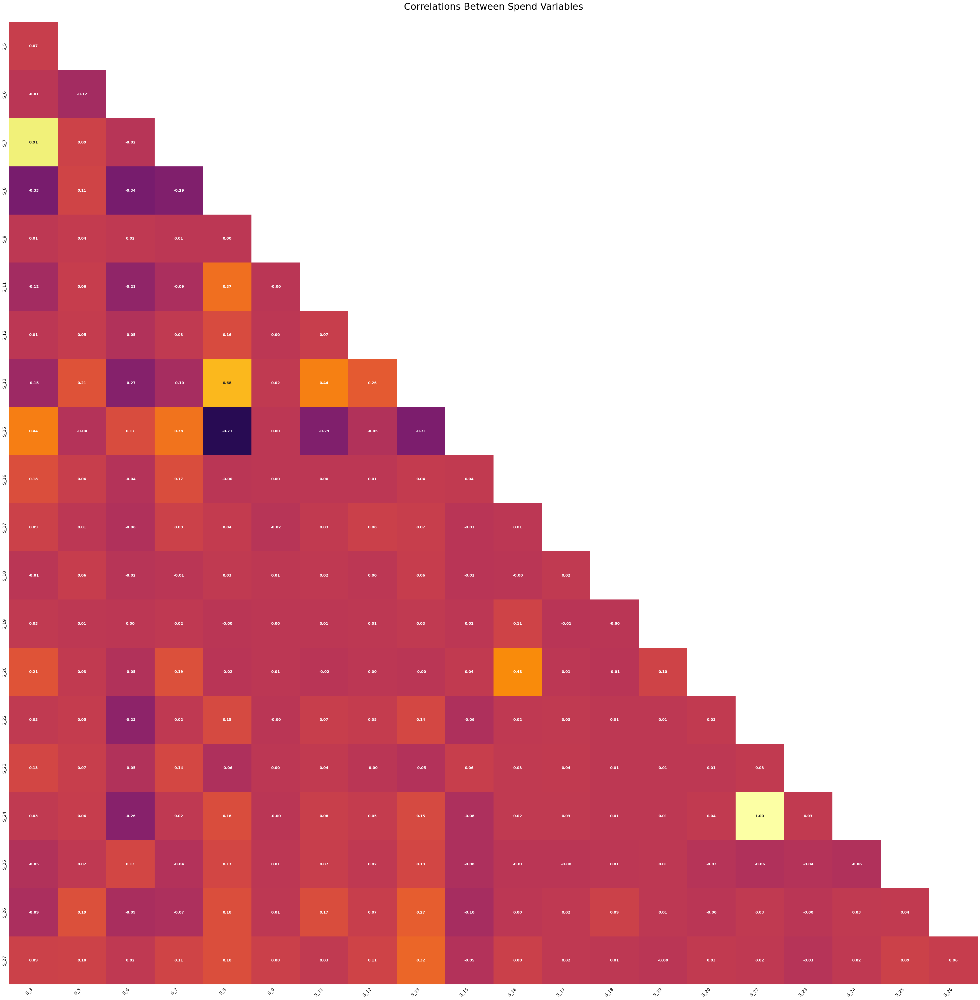

In [42]:
# spend columns

cols=[col for col in df_train.columns if (col.startswith(('S','t'))) & (col not in cat_cols+['S_2'])]
plot_corr_heatmap(cols, 'Correlations Between Spend Variables')

In [43]:
# spend columns with very high correlation

corr=df_train[cols].iloc[:,:-1].corr()
np.fill_diagonal(corr.values, 0.0)
mask = np.triu(np.ones_like(corr, dtype=bool))
corr = corr.mask(mask)
highly_correlated_features = corr[np.abs(corr) > 0.9].stack().reset_index()
highly_correlated_features=highly_correlated_features.iloc[abs(highly_correlated_features[0]).argsort()[::-1]].reset_index()
highly_correlated_features

,index,level_0,level_1,0
0,1,S_24,S_22,0.997295
1,0,S_7,S_3,0.912869


#### Key Insights:
- The spend variables seem informative about the target and should be included in modelling.

- Some of the spend features are highly correlated to eachother, with correlation between S_22 and S_24 being the highest. Keep in mind that this is the Pearson's correlation coefficient. It only measures linear relationships. Nonlinear relationships might not be well-represented by this coefficient.

### Payment Features

In [44]:
# payment variables

payment_features = sorted([f for f in df_train.columns if (f not in ['customer_ID', 'target', 'S_2']) and (f.startswith(('P')))])
print(f"Number of payment features: {len(payment_features)}")
print(f"Number of numerical payment features: {len([f for f in payment_features if f not in cat_cols])}")

Number of payment features: 3
Number of numerical payment features: 3


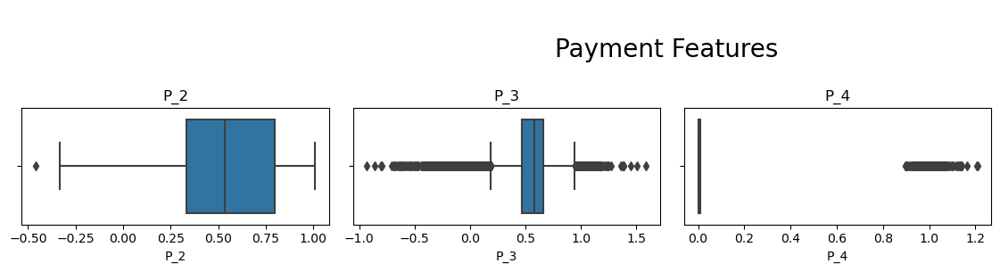

In [45]:
# boxplot of payment variables

plot_boxplots(payment_features, 'Payment Features')

In [46]:
# payment columns

cols=[col for col in df_train.columns if (col.startswith(('P','t'))) & (col not in cat_cols)]

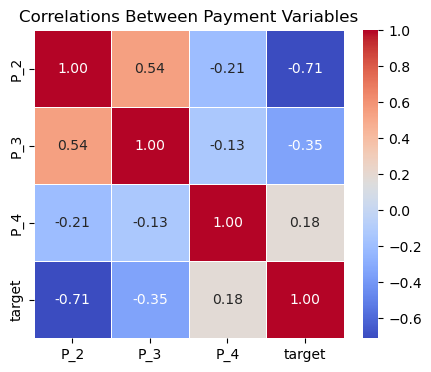

In [47]:
def plot_corr_hmap(cols, title, size=(5, 4)):
    corr_matrix = df_train[cols].corr()

    plt.figure(figsize=size)
    sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5)
    plt.title(title)
    plt.show()

plot_corr_hmap(cols, 'Correlations Between Payment Variables')

In [48]:
# correlation values of spend variables
# not highly correlated

corr=df_train[cols].iloc[:,:-1].corr()
corr.values

array([[ 1.        ,  0.54424468, -0.20539806],
       [ 0.54424468,  1.        , -0.13312878],
       [-0.20539806, -0.13312878,  1.        ]])

#### Key Insights:
- There are only three payment variables. They are not highly correlated to each other.

### Balance features

In [49]:
balance_features = sorted([f for f in df_train.columns if (f not in  ['customer_ID', 'target', 'S_2']) and (f.startswith(('B')))])
print(f"Number of balance features: {len(balance_features)}")
print(f"Number of numerical balance features: {len([f for f in balance_features if f not in cat_cols])}")

Number of balance features: 40
Number of numerical balance features: 38


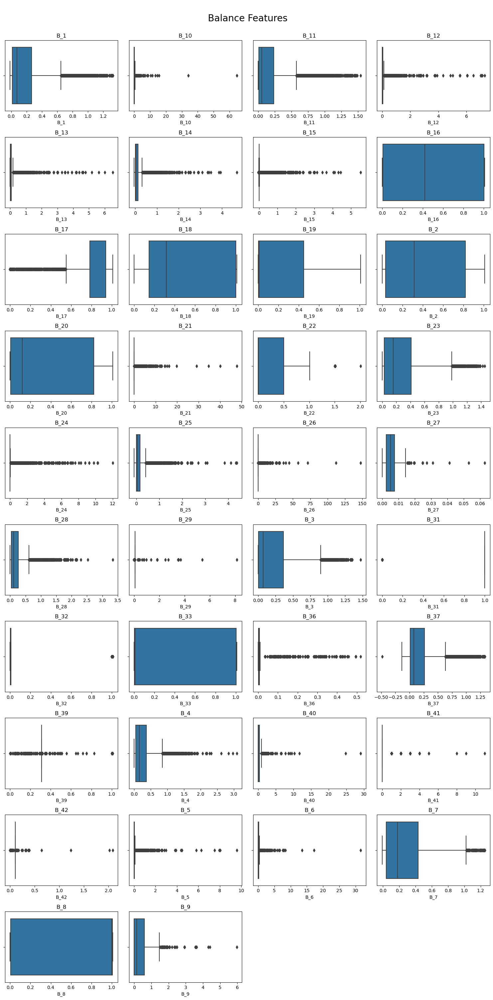

In [50]:
# box plot for balance data

plot_boxplots(balance_features, 'Balance Features')

In [51]:
# balance columns

cols=[col for col in df_train.columns if (col.startswith(('B','t'))) & (col not in cat_cols)]

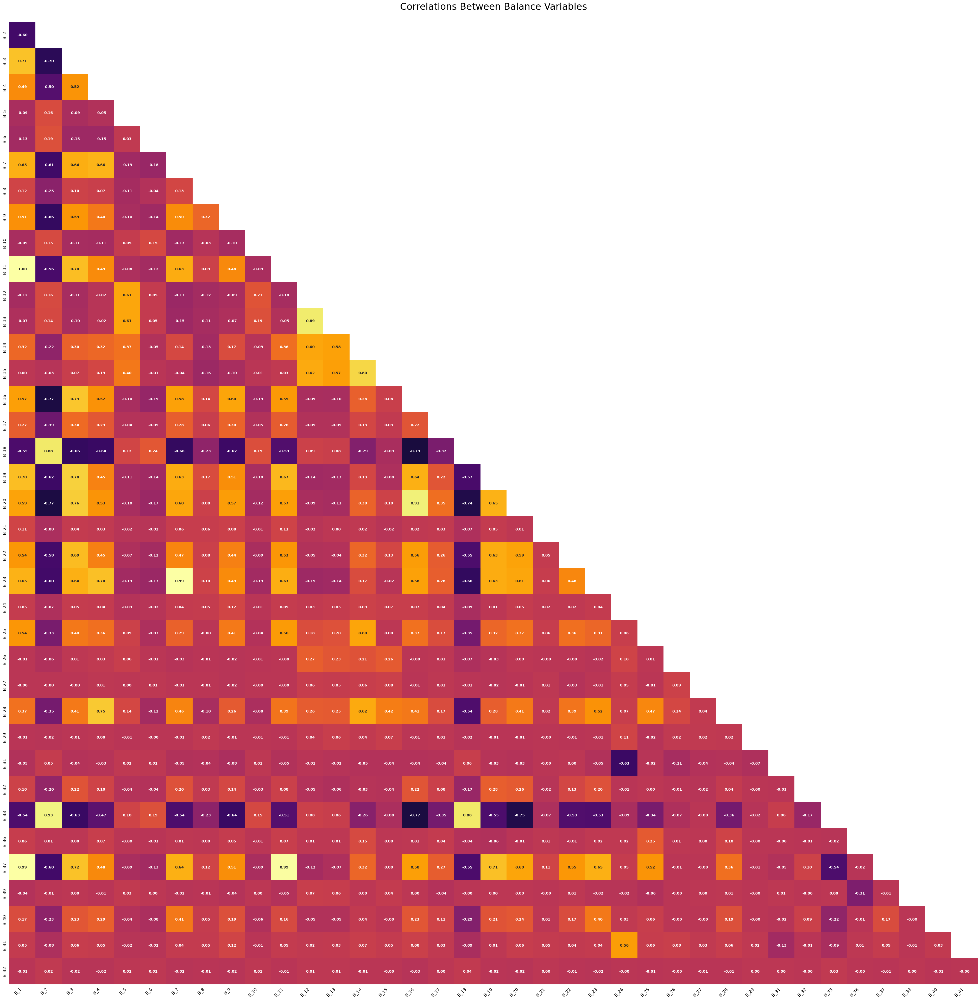

In [52]:
plot_corr_heatmap(cols, 'Correlations Between Balance Variables')

In [53]:
# high correlation variables

corr=df_train[cols].iloc[:,:-1].corr()
np.fill_diagonal(corr.values, 0.0)
mask = np.triu(np.ones_like(corr, dtype=bool))
corr = corr.mask(mask)
highly_correlated_features = corr[np.abs(corr) > 0.9].stack().reset_index()
highly_correlated_features=highly_correlated_features.iloc[abs(highly_correlated_features[0]).argsort()[::-1]].reset_index()
highly_correlated_features

,index,level_0,level_1,0
0,0,B_11,B_1,0.996016
1,2,B_23,B_7,0.994286
2,4,B_37,B_1,0.993259
3,5,B_37,B_11,0.988871
4,3,B_33,B_2,0.928462
5,1,B_20,B_16,0.906573


#### Key Insights:
- There are 38 numerical balance features and 2 categorical balance features, some of which are highly correlated to eachother.

- They seem to have good amount of information about the target and will be included in the modelling.

### Risk Features

In [54]:
# risk features

risk_features = sorted([f for f in df_train.columns if (f not in ['customer_ID', 'target', 'S_2']) and (f.startswith(('R')))])
print(f"Number of risk features: {len(risk_features)}")
print(f"Number of numerical risk features: {len([f for f in risk_features if f not in cat_cols])}")

Number of risk features: 28
Number of numerical risk features: 28


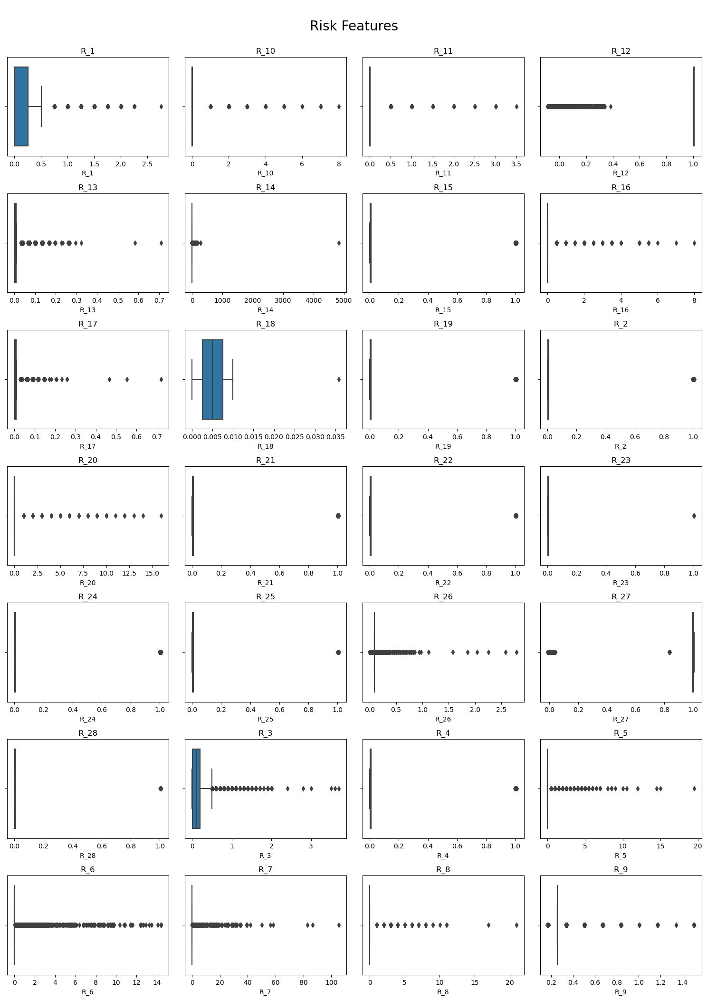

In [55]:
# box plots

plot_boxplots(risk_features, 'Risk Features')

In [56]:
# risk columns

cols=[col for col in df_train.columns if (col.startswith(('R','t'))) & (col not in cat_cols)]

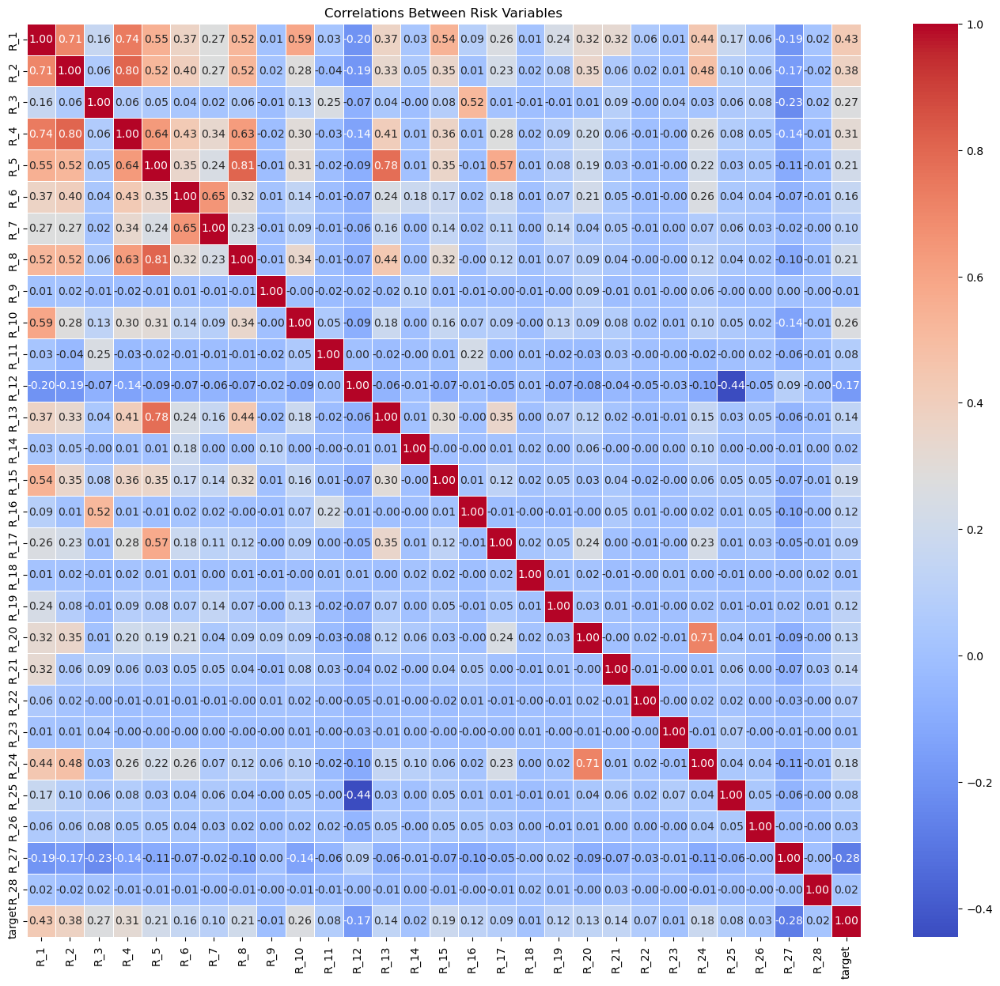

In [57]:
def plot_corr_hmap(cols, title, size=(17, 15)):
    corr_matrix = df_train[cols].corr()

    plt.figure(figsize=size)
    sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5)
    plt.title(title)
    plt.show()

plot_corr_hmap(cols, 'Correlations Between Risk Variables')

In [58]:
# high correlation columns

corr=df_train[cols].iloc[:,:-1].corr()
np.fill_diagonal(corr.values, 0.0)
mask = np.triu(np.ones_like(corr, dtype=bool))
corr = corr.mask(mask)
highly_correlated_features = corr[np.abs(corr) > 0.8].stack().reset_index()
highly_correlated_features=highly_correlated_features.iloc[abs(highly_correlated_features[0]).argsort()[::-1]].reset_index()
highly_correlated_features

,index,level_0,level_1,0
0,1,R_8,R_5,0.806225
1,0,R_4,R_2,0.804854


#### Key Insights:

- There are 28 numerical risk features and no categorical risk features.

- Most risk features are not highly correlated to eachother. The highest correlation is between R_5 and R_8.

- They seem to have good amount of information about the target and will be included in the modelling.

In [59]:
# # Correlation of Variables with the Target

# targ = df_train.iloc[:, :-1].corrwith(df_train['target'], axis=0)
# val = [str(round(v * 100, 1)) + '%' for v in targ.values]

# fig, ax = plt.subplots(figsize=(12, 30))
# sns.barplot(x=targ.values, y=targ.index, palette='coolwarm')

# for i, label in enumerate(val):
#     # Check if the value is finite before adding text
#     if np.isfinite(targ.values[i]):
#         ax.text(targ.values[i] + 0.02, i, label, ha='left', va='center', fontsize=10)

# ax.set_title("Correlation of Numerical Features with the Target", fontsize=16)
# ax.set_facecolor('none')
# ax.tick_params(axis='y', which='both', left=False)
# ax.spines[['top', 'bottom', 'left', 'right']].set_visible(False)

# plt.tight_layout()
# plt.show()

In [60]:
lab_enc = LabelEncoder()
for cat_feat in cat_cols:
    df_train[cat_feat] = lab_enc.fit_transform(df_train[cat_feat])

# Data Reduction

In [61]:
from scipy.stats import skew

In [62]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>
Index: 10000 entries, 77c5663b7dccc0d32c5ba92c35aae433738896f481ec688dab4420d7171022b1 to ec5123aded3d267eb5602ab5932a43aff70ee5ad69c6d7e1ef12bc6a9243fc3b
Columns: 190 entries, S_2 to target
dtypes: datetime64[ns](1), float64(177), int32(2), int64(10)
memory usage: 14.7+ MB


- Chi Squared test performed for the independence between all pairs of categorical variables in the DataFrame

- This type of analysis is useful for understanding the relationships between different categorical variables in the dataset.

In [63]:
def Chi_Square_Test(var1,var2):
    dataset = df_train
    contingency_table = pd.crosstab(dataset[f'{var1}'],dataset[f'{var2}'])
    Observed_Values = contingency_table.values

    b = scipy.stats.chi2_contingency(contingency_table)
    Expected_Values = b[3]

    N_rows,N_columns = contingency_table.shape
    Dof = (N_rows-1)*(N_columns-1)

    alpha = 0.05

    chi_square = sum([(o-e)**2./e for o,e in zip(Observed_Values,Expected_Values)])
    chi_square_statistic = chi_square[0] + chi_square[1]

    critical_value = chi2.ppf(q = 1-alpha,df = Dof)
    P_value = 1 - chi2.cdf(x = chi_square_statistic,df = Dof)

    print(colored(f"Chi - Square test between {var1} and {var2} :"))
    print('Significance level: ',alpha)
    print('Degree of Freedom: ',Dof)
    print('chi-square statistic:',chi_square_statistic)
    print('critical_value:',critical_value)

    if chi_square_statistic >= critical_value:
        print(colored("Reject hypothesis, variables are dependent"))
    else:
        print(colored(f"Retain hypothesis, variables are independent"))
    print('\n')


columns=df_train.columns
i=0
j=0
for i in range(len(columns)):
    for j in range(len(columns)):
        if(i!=j):
            Chi_Square_Test(columns[i],columns[j])

Chi - Square test between S_2 and P_2 :
Significance level:  0.05
Degree of Freedom:  101490
chi-square statistic: 50.721513711761276
critical_value: 102232.19615384344
Retain hypothesis, variables are independent


Chi - Square test between S_2 and D_39 :
Significance level:  0.05
Degree of Freedom:  128910
chi-square statistic: 73.93369557741246
critical_value: 129746.3260074543
Retain hypothesis, variables are independent


Chi - Square test between S_2 and B_1 :
Significance level:  0.05
Degree of Freedom:  182820
chi-square statistic: 56.89230875045136
critical_value: 183815.74867441555
Retain hypothesis, variables are independent


Chi - Square test between S_2 and B_2 :
Significance level:  0.05
Degree of Freedom:  116760
chi-square statistic: 80.65797509983557
critical_value: 117555.99294281029
Retain hypothesis, variables are independent


Chi - Square test between S_2 and R_1 :
Significance level:  0.05
Degree of Freedom:  100110
chi-square statistic: 50.05646174809169
critic

IndexError: index 1 is out of bounds for axis 0 with size 1

In [64]:
non_int_float_columns = df_train.select_dtypes(exclude=['int64', 'float16','float64']).columns.to_list()


In [65]:
len(non_int_float_columns)

3

In [66]:
df1=df_train[non_int_float_columns]
df1.shape

(10000, 3)

In [67]:
df2 = df_train.copy()
df2.shape

(10000, 190)

In [68]:
df2=df2.drop(non_int_float_columns,axis=1)

In [69]:
df2.shape

(10000, 187)

In [70]:
plt.figure(figsize=(120,120),dpi=100)
sns.heatmap(df2.corr(),cmap='coolwarm',fmt=".1f",annot=True)

<AxesSubplot:>

- This code is checking for highly correlated (duplicated) pairs of attributes in a DataFrame using the Pearson correlation coefficient. The goal is to identify pairs of attributes that have a correlation greater than 0.90 and print a message indicating their correlation.

- This will enhance model interpretability,improve computational efficiency, and streamline the dataset for better performance.

In [71]:
Keys = df2.keys()
Keys = np.delete(Keys,2)
for i in range(len(Keys)):
    for j in range(len(Keys)):
        corr, _ = pearsonr(df2[Keys[i]], df2[Keys[j]])
        if i != j:
            if (corr)>0.90:
                print(f'Attributes {Keys[i]} and {Keys[j]} both are duplicated with the {corr}')

Attributes B_2 and B_33 both are duplicated with the 0.9284618395766475
Attributes S_3 and S_7 both are duplicated with the 0.9128693783340661
Attributes B_7 and B_23 both are duplicated with the 0.9942859119652039
Attributes B_11 and B_37 both are duplicated with the 0.988871447968585
Attributes S_7 and S_3 both are duplicated with the 0.9128693783340661
Attributes D_58 and D_74 both are duplicated with the 0.9174361363048014
Attributes D_58 and D_75 both are duplicated with the 0.9246732500496417
Attributes B_16 and B_20 both are duplicated with the 0.9065728119652467
Attributes B_20 and B_16 both are duplicated with the 0.9065728119652467
Attributes B_23 and B_7 both are duplicated with the 0.9942859119652039
Attributes D_74 and D_58 both are duplicated with the 0.9174361363048014
Attributes D_74 and D_75 both are duplicated with the 0.988429250371811
Attributes D_75 and D_58 both are duplicated with the 0.9246732500496417
Attributes D_75 and D_74 both are duplicated with the 0.9884

In [73]:
df3=df2.copy()


In [74]:
Redundant_columns = ['B_2','S_3','B_7','B_11','B_12','D_58','B_14','D_74','S_22','D_103','D_118','D_139','D_141']
df3 = df3.drop(Redundant_columns, axis = 1)

In [75]:
df3.shape

(10000, 174)

# Dimensionality or Attribute Reduction by PCA

In [76]:
df_pca=df3.drop('target',axis=1)
df_pca

,P_2,D_39,B_1,R_1,D_41,B_3,D_42,D_43,D_44,B_4,...,D_134,D_135,D_136,D_137,D_138,D_140,D_142,D_143,D_144,D_145
customer_ID,,,,,,,,,,,,,,,,,,,,,
77c5663b7dccc0d32c5ba92c35aae433738896f481ec688dab4420d7171022b1,0.403564,0.003876,0.027405,0.007385,0.005810,0.016449,0.007431,0.199236,0.002705,0.001417,...,0.331745,0.022783,0.243511,0.012366,0.156352,0.004417,0.402223,0.003885,0.002804,0.008415
d226726f4855dd40a9fa078076a075213afdf6255a28ec8c2cc42e649417aadd,0.895996,0.621582,0.045929,0.003428,0.008507,0.003998,0.218749,0.032654,0.009392,0.129639,...,0.331745,0.022783,0.243511,0.012366,0.156352,0.007290,0.402223,0.006397,0.009399,0.007771
9fc19a426b4be2f3f94ee0353fbf2af5bc07034ab4d114f51fa6f1e8a2f59485,0.898438,0.003109,0.009033,0.008202,0.008812,0.001792,0.218749,0.199236,0.000623,0.004021,...,0.331745,0.022783,0.243511,0.012366,0.156352,0.009331,0.402223,0.002199,0.001502,0.005436
b8693ba5833efc77c04a1ed7602059cba3a823eef05115594e86083a21899978,0.959473,0.155029,0.034241,0.002594,0.009056,0.007381,0.218749,0.075073,0.000665,0.033081,...,0.331745,0.022783,0.243511,0.012366,0.156352,0.009605,0.402223,0.006577,0.007214,0.007538
6d75465cd9841d9b501073bc3e9d852af8338527171c61fbb31d85adeaf22105,0.494385,0.000476,0.005394,0.008430,0.000103,0.020752,0.218749,0.110718,0.005638,0.003960,...,0.331745,0.022783,0.243511,0.012366,0.156352,0.002129,0.402223,0.005917,0.009918,0.004791
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
f5761112bbc284922776913c48a1ce73441521da56ecd45d05a318a23fae70a3,-0.068604,0.182861,0.114868,0.509766,0.479980,0.160156,0.218749,0.199236,0.132446,0.949219,...,0.331745,0.022783,0.243511,0.012366,0.156352,0.002131,0.402223,0.003708,0.002853,0.005043
b321f323a4c19c8a1c74071c7c357d62c5a7bf0fac83973d42e7a020390ac9cf,0.238037,0.500977,0.064026,0.009842,0.250244,0.080444,0.185425,0.210571,1.125977,0.295898,...,0.331745,0.022783,0.243511,0.012366,0.156352,0.002617,0.402223,0.005291,0.006050,0.001656
5ce1493259fff61f8432be6988a3fa00c4f538a6788055dd08ce6a6451569c4b,0.384521,0.005371,0.008530,0.000352,0.009399,0.007965,0.477539,0.082397,0.383789,0.285400,...,0.331745,0.022783,0.243511,0.012366,0.156352,0.002937,0.000107,1.003906,0.007420,0.189697


In [77]:
# Step I : Feature Scaling ( Transforming the data values of all the attributes on single scale )
scaler = StandardScaler()
scaler.fit(df_pca)
scaled_ds = pd.DataFrame(scaler.transform(df_pca),columns= df_pca.columns )
scaled_ds

,P_2,D_39,B_1,R_1,D_41,B_3,D_42,D_43,D_44,B_4,...,D_134,D_135,D_136,D_137,D_138,D_140,D_142,D_143,D_144,D_145
0,-0.456244,-0.537229,-0.621111,-0.487865,-0.400517,-0.708784,-1.835528e+00,0.000000,-0.725737,-0.891269,...,8.096681e-16,2.212622e-16,-1.107875e-15,0.0,0.0,-0.199603,-4.849425e-16,-0.506486,-0.268900,-0.312752
1,1.237378,0.643768,-0.552667,-0.498678,-0.393850,-0.751969,2.410879e-16,-0.739925,-0.702621,-0.432767,...,8.096681e-16,2.212622e-16,-1.107875e-15,0.0,0.0,-0.184428,-4.849425e-16,-0.500201,-0.231927,-0.315657
2,1.245775,-0.538695,-0.688991,-0.485634,-0.393096,-0.759620,2.410879e-16,0.000000,-0.732934,-0.881959,...,8.096681e-16,2.212622e-16,-1.107875e-15,0.0,0.0,-0.173646,-4.849425e-16,-0.510705,-0.276197,-0.326177
3,1.455693,-0.248238,-0.595853,-0.500955,-0.392492,-0.740234,2.410879e-16,-0.551507,-0.732789,-0.778043,...,8.096681e-16,2.212622e-16,-1.107875e-15,0.0,0.0,-0.172196,-4.849425e-16,-0.499752,-0.244180,-0.316705
4,-0.143885,-0.543729,-0.702437,-0.485009,-0.414623,-0.693859,2.410879e-16,-0.393181,-0.715597,-0.882177,...,8.096681e-16,2.212622e-16,-1.107875e-15,0.0,0.0,-0.211694,-4.849425e-16,-0.501404,-0.229019,-0.329082
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,-2.080173,-0.195025,-0.297948,0.884668,0.771576,-0.210348,2.410879e-16,0.000000,-0.277255,2.497934,...,8.096681e-16,2.212622e-16,-1.107875e-15,0.0,0.0,-0.211684,-4.849425e-16,-0.506930,-0.268622,-0.327947
9996,-1.025542,0.413182,-0.485802,-0.481153,0.203696,-0.486821,-2.894552e-01,0.050349,3.157108,0.161754,...,8.096681e-16,2.212622e-16,-1.107875e-15,0.0,0.0,-0.209115,-4.849425e-16,-0.502969,-0.250702,-0.343211
9997,-0.521738,-0.534370,-0.690851,-0.507080,-0.391644,-0.738209,2.247880e+00,-0.518974,0.591568,0.124215,...,8.096681e-16,2.212622e-16,-1.107875e-15,0.0,0.0,-0.207422,-3.512860e+00,1.995608,-0.243025,0.504130
9998,-0.973483,1.205765,0.245543,0.882000,1.589904,0.431511,-5.810421e-01,2.199135,0.147662,0.118104,...,8.096681e-16,2.212622e-16,-1.107875e-15,0.0,0.0,-0.198414,1.267940e+00,2.002938,1.699786,2.131223


In [78]:
# Step II : Initiating PCA to reduce dimentions features to 3
pca = PCA(n_components = 3)
pca.fit(scaled_ds)
PCA_ds = pd.DataFrame(pca.transform(scaled_ds), columns=(["PC1","PC2","PC3"]))
PCA_ds.describe().T

,count,mean,std,min,25%,50%,75%,max
PC1,10000.0,-2.771805e-15,4.287121,-9.932752,-3.849275,-0.120025,3.168915,21.263492
PC2,10000.0,1.409539e-16,2.659066,-5.839368,-1.812191,-0.193958,1.337197,32.770063
PC3,10000.0,-2.842171e-17,2.579417,-11.455743,-1.482283,0.119870,1.566282,17.295842


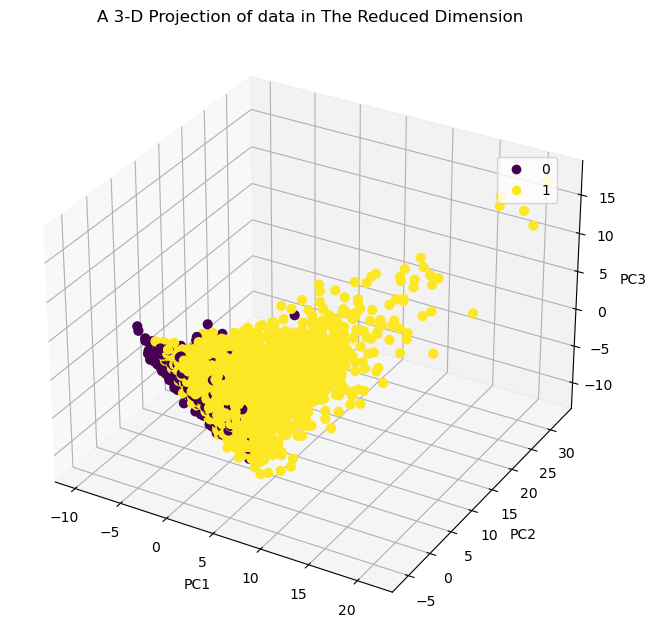

In [79]:
# 3d projection of dataset
x = PCA_ds["PC1"]
y = PCA_ds["PC2"]
z = PCA_ds["PC3"]

fig = plt.figure(figsize = (6,6))
ax = Axes3D(fig, auto_add_to_figure=False)
fig.add_axes(ax)
cmap = 'viridis'
sc = ax.scatter(x, y, z, s=40, c=df_train['target'], marker='o', cmap=cmap, alpha=1)
ax.set_xlabel('PC1')
ax.set_ylabel('PC2')
ax.set_zlabel('PC3')
ax.set_title(f'''A 3-D Projection of data in The Reduced Dimension''')
plt.legend(*sc.legend_elements(), bbox_to_anchor=(0.8,0.8), loc=2)

Text(0, 0.5, 'Information retained')

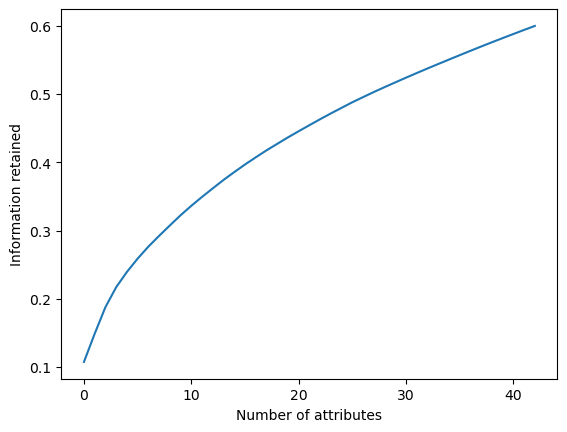

In [80]:
PCA_43 = PCA(n_components = 43,random_state = 2)
PCA_43.fit(scaled_ds)

plt.plot(np.cumsum(PCA_43.explained_variance_ratio_))
plt.xlabel('Number of attributes')
plt.ylabel('Information retained')

# Undersampling is not good approch Reduces Number of Datapoints

In [81]:

Y=df3['target']

In [82]:
X=df3.drop('target',axis=1)

In [83]:
X_train,X_test,y_train,y_test = train_test_split(X,Y,test_size=0.2,random_state=0)

In [84]:
X_train.shape,X_test.shape

((8000, 173), (2000, 173))

In [85]:
y_train.value_counts()

0    4012
1    3988
Name: target, dtype: int64

In [86]:
y_test.value_counts()

1    1012
0     988
Name: target, dtype: int64

# Model Work

In [87]:

from sklearn.model_selection import GridSearchCV
param_grid = {
    'max_depth': [2,4,6,8,10,12],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'criterion': ['gini', 'entropy']
}
classifier = DecisionTreeClassifier()
grid_search = GridSearchCV(estimator=classifier, param_grid=param_grid, cv=5, verbose=1, scoring='accuracy')#makes the Tree on best attributes
grid_search.fit(X_train,y_train)
Model =grid_search.best_estimator_
grid_search.best_params_

Fitting 5 folds for each of 108 candidates, totalling 540 fits


{'criterion': 'gini',
 'max_depth': 4,
 'min_samples_leaf': 1,
 'min_samples_split': 2}

In [88]:
x_train_prediction=Model.predict(X_train)

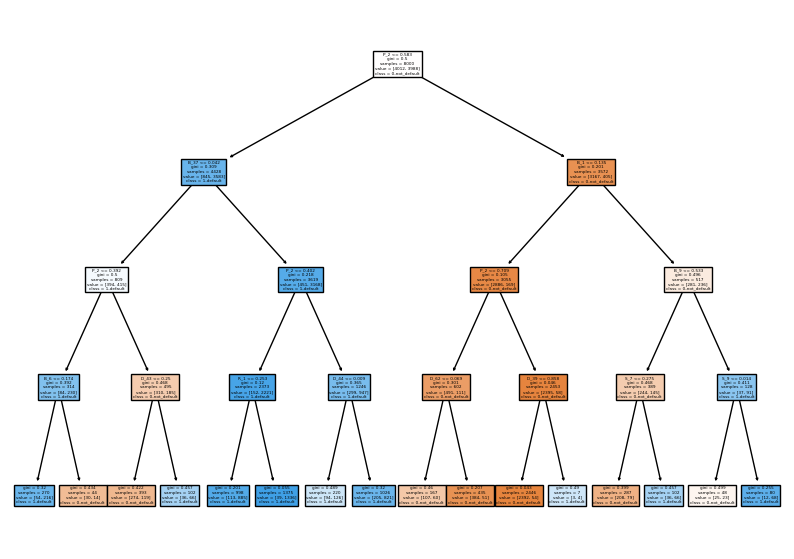

In [89]:
from sklearn import tree

plt.figure(figsize=(10,7))
features = df3.columns
classes = ['0-not_default','1-default']
tree.plot_tree(Model,feature_names=features,class_names=classes,filled=True)
plt.show()

In [91]:
def Confusion_Matrix(C_M):
    group_names  = ['True Negative','False Positive','False Negative','True Positive']
    group_counts = ['{0:0.0f}'.format(value) for value in C_M.flatten()]
    group_percentages = ['{0:.2%}'.format(value) for value in C_M.flatten()/np.sum(C_M)]
    labels = [f'{v1}\n{v2}\n{v3}' for v1, v2, v3 in zip(group_names,group_counts,group_percentages)]
    labels = np.asarray(labels).reshape(2,2)
    sns.heatmap(C_M, annot=labels, fmt='', cmap='coolwarm')
    plt.ylabel('Actual Labels')
    plt.xlabel('Predicted Labels')
    plt.title('Confusion Matrix')

In [92]:
def Evaluation_of_classifier(y_train, X_train_predicted):
    print('Accuracy :',np.round(accuracy_score(y_train, X_train_predicted),2))
    print('Error Rate :',1-np.round(accuracy_score(y_train, X_train_predicted),2))
    print('Recall or Sensitivity :',recall_score(y_train, X_train_predicted))
    print('Precision :',precision_score(y_train, X_train_predicted))
    print('F1 Score :',f1_score(y_train, X_train_predicted))

# 1.Model Prediction on Training Data

Accuracy : 0.88
Error Rate : 0.12
Recall or Sensitivity : 0.8996990972918756
Precision : 0.8583732057416268
F1 Score : 0.8785504407443682


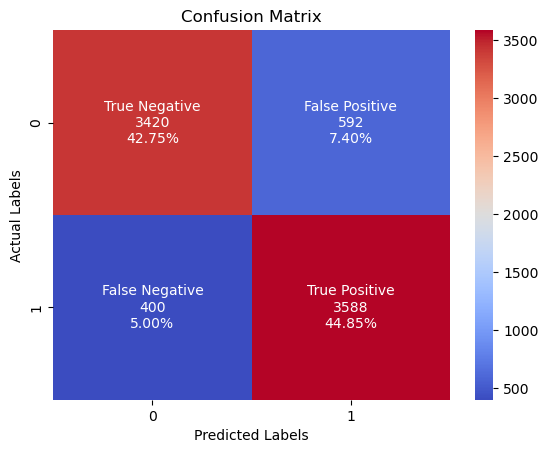

In [93]:
C_M = confusion_matrix(y_train, x_train_prediction)
Confusion_Matrix(C_M)

Evaluation_of_classifier(y_train, x_train_prediction)

# 2.Model Predicition on test Data

Accuracy : 0.87
Error Rate : 0.13
Recall or Sensitivity : 0.9041501976284585
Precision : 0.8535447761194029
F1 Score : 0.8781190019193859


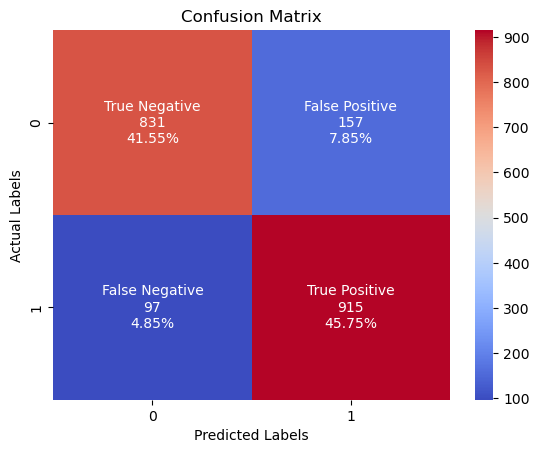

In [94]:
y_predt = Model.predict(X_test)
C_M = confusion_matrix(y_test, y_predt)
Confusion_Matrix(C_M)

Evaluation_of_classifier(y_test, y_predt)

# Randome Forest Classification

# Hyper-Parameter Tuning

In [95]:
from pprint import pprint
rf = RandomForestClassifier(random_state = 42)
print('Parameters currently in use:\n')
pprint(rf.get_params())

Parameters currently in use:

{'bootstrap': True,
 'ccp_alpha': 0.0,
 'class_weight': None,
 'criterion': 'gini',
 'max_depth': None,
 'max_features': 'auto',
 'max_leaf_nodes': None,
 'max_samples': None,
 'min_impurity_decrease': 0.0,
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'min_weight_fraction_leaf': 0.0,
 'n_estimators': 100,
 'n_jobs': None,
 'oob_score': False,
 'random_state': 42,
 'verbose': 0,
 'warm_start': False}


In [96]:
from sklearn.model_selection import RandomizedSearchCV

n_estimators = [int(x) for x in np.linspace(start = 200, stop = 2000, num = 10)]
max_depth = [int(x) for x in np.linspace(10, 110, num = 11)]

max_depth.append(None)
min_samples_split = [2, 5, 10]
min_samples_leaf = [1, 2, 4]
bootstrap = [True, False]

# Create the random grid
random_grid = {'n_estimators': n_estimators,
#                'max_features': max_features,
               'max_depth': max_depth,
               'min_samples_split': min_samples_split,
               'min_samples_leaf': min_samples_leaf,
               'bootstrap': bootstrap}
pprint(random_grid)

{'bootstrap': [True, False],
 'max_depth': [10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 110, None],
 'min_samples_leaf': [1, 2, 4],
 'min_samples_split': [2, 5, 10],
 'n_estimators': [200, 400, 600, 800, 1000, 1200, 1400, 1600, 1800, 2000]}


# RandomSearch Training Model

In [97]:
rf = RandomForestClassifier()                  # Create the base model to tune

rf_random = RandomizedSearchCV(estimator = rf,
                               param_distributions = random_grid,
                               n_iter = 10,   # search across 1000 different combinations, and use all available cores
                               cv = 3,         # Random search of parameters, using 3 fold cross validation
                               verbose=2,
                               random_state=42,
                               n_jobs = -1)

# Fit the random search model
rf_random.fit(X_train, y_train)

Fitting 3 folds for each of 10 candidates, totalling 30 fits


RandomizedSearchCV(cv=3, estimator=RandomForestClassifier(), n_jobs=-1,
                   param_distributions={'bootstrap': [True, False],
                                        'max_depth': [10, 20, 30, 40, 50, 60,
                                                      70, 80, 90, 100, 110,
                                                      None],
                                        'min_samples_leaf': [1, 2, 4],
                                        'min_samples_split': [2, 5, 10],
                                        'n_estimators': [200, 400, 600, 800,
                                                         1000, 1200, 1400, 1600,
                                                         1800, 2000]},
                   random_state=42, verbose=2)

In [98]:
rf_random.best_params_

{'n_estimators': 1800,
 'min_samples_split': 5,
 'min_samples_leaf': 1,
 'max_depth': 70,
 'bootstrap': False}

# Evaluate The Model

In [100]:
def evaluate(model, X_test, y_test):
    y_predicted = model.predict(X_test)
    print('Accuracy :',100*np.round(accuracy_score(y_test, y_predicted),2),'%')
    print('Error Rate :',100-100*np.round(accuracy_score(y_test, y_predicted),2),'%')
    print('Recall or Sensitivity :',100*recall_score(y_test, y_predicted),'%')
    print('Precision :',100*precision_score(y_test, y_predicted),'%')
    print('F1 Score :',100*f1_score(y_test, y_predicted),'%')

    C_M = confusion_matrix(y_test, y_predicted)
    Confusion_Matrix(C_M)

# Base Model

Accuracy : 88.0 %
Error Rate : 12.0 %
Recall or Sensitivity : 88.73517786561264 %
Precision : 86.84719535783366 %
F1 Score : 87.78103616813293 %


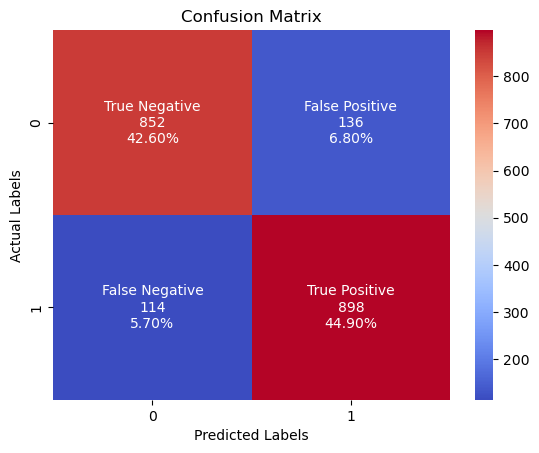

In [101]:
base_model = RandomForestClassifier(n_estimators = 10, random_state = 42)
base_model.fit(X_train, y_train)
evaluate(base_model, X_test, y_test)

# Random Model

Accuracy : 89.0 %
Error Rate : 11.0 %
Recall or Sensitivity : 93.57707509881423 %
Precision : 86.48401826484017 %
F1 Score : 89.89084005695301 %


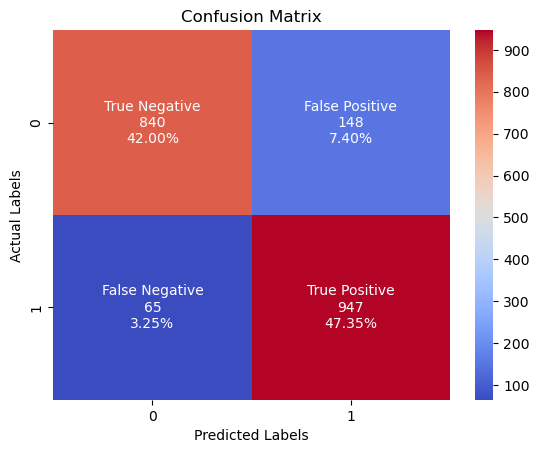

In [102]:
best_random = rf_random.best_estimator_
evaluate(best_random, X_test, y_test)

# Grid Search With Cross Validation

In [103]:
param_grid = {
    'bootstrap': [True],
    'max_depth': [80, 90, 100, 110],
    'max_features': [2, 3],
    'min_samples_leaf': [3, 4, 5],
    'min_samples_split': [8, 10, 12],
    'n_estimators': [100, 200, 300, 1000]
}

# Create a based model
rf = RandomForestClassifier()

# Instantiate the grid search model
grid_search = GridSearchCV(estimator = rf,
                           param_grid = param_grid,
                           cv = 3,
                           n_jobs = -1,
                           verbose = 2)

# Best HyperParameter

In [104]:
grid_search.fit(X_train, y_train)
grid_search.best_params_

Fitting 3 folds for each of 288 candidates, totalling 864 fits


{'bootstrap': True,
 'max_depth': 90,
 'max_features': 3,
 'min_samples_leaf': 3,
 'min_samples_split': 8,
 'n_estimators': 100}

# Evaluate The model

In [105]:
grid_search.fit(X_train, y_train)

Fitting 3 folds for each of 288 candidates, totalling 864 fits


GridSearchCV(cv=3, estimator=RandomForestClassifier(), n_jobs=-1,
             param_grid={'bootstrap': [True], 'max_depth': [80, 90, 100, 110],
                         'max_features': [2, 3], 'min_samples_leaf': [3, 4, 5],
                         'min_samples_split': [8, 10, 12],
                         'n_estimators': [100, 200, 300, 1000]},
             verbose=2)

Accuracy : 88.0 %
Error Rate : 12.0 %
Recall or Sensitivity : 92.78656126482213 %
Precision : 85.36363636363636 %
F1 Score : 88.92045454545455 %


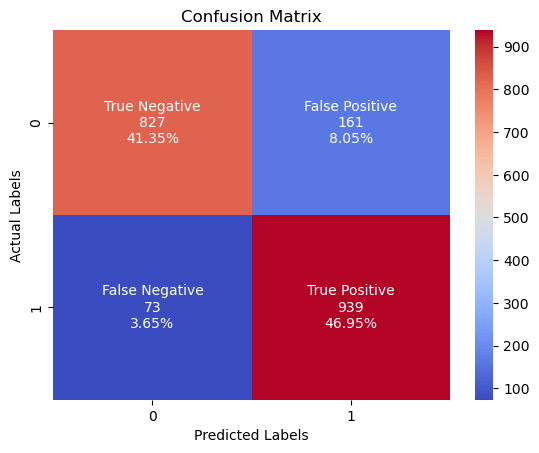

In [106]:
best_grid = grid_search.best_estimator_
evaluate(best_grid, X_test, y_test) 

# Naive Bayes

In [107]:
from sklearn.model_selection import cross_val_score
model = GaussianNB()


In [108]:
cv_scores = cross_val_score(model, X_train, y_train, cv=10)
print(model, ' mean accuracy: ', round(cv_scores.mean()*100, 3), '% std: ', round(cv_scores.var()*100, 3),'%')


GaussianNB()  mean accuracy:  82.65 % std:  0.025 %


In [109]:
y_pred = model.fit(X_train, y_train).predict(X_test)
print("Number of mislabeled points out of a total %d points : %d" % (X_test.shape[0], (y_test != y_pred).sum()))

Number of mislabeled points out of a total 2000 points : 333


# Model Evaluation on the training Dataset

Accuracy : 83.0 %
Error Rate : 17.0 %
Recall or Sensitivity : 74.94984954864594 %
Precision : 89.250522544043 %
F1 Score : 81.4774430966335 %


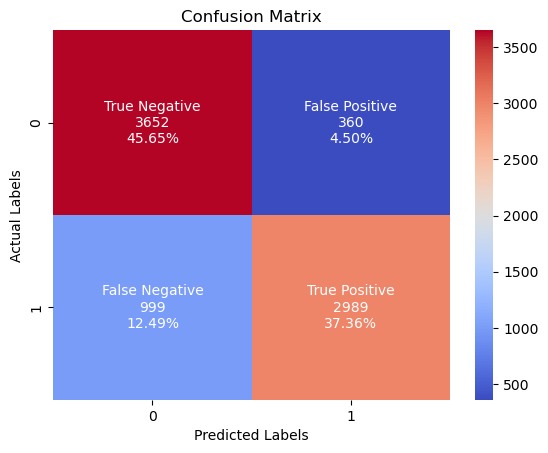

In [110]:
evaluate(model, X_train, y_train)

In [111]:
from sklearn.metrics import classification_report
predict_test = model.predict(X_test)
print(classification_report(y_test,predict_test))

              precision    recall  f1-score   support

           0       0.79      0.90      0.84       988
           1       0.89      0.77      0.82      1012

    accuracy                           0.83      2000
   macro avg       0.84      0.83      0.83      2000
weighted avg       0.84      0.83      0.83      2000



# ROC CURVE

Text(0, 0.5, 'True Positive Rate')

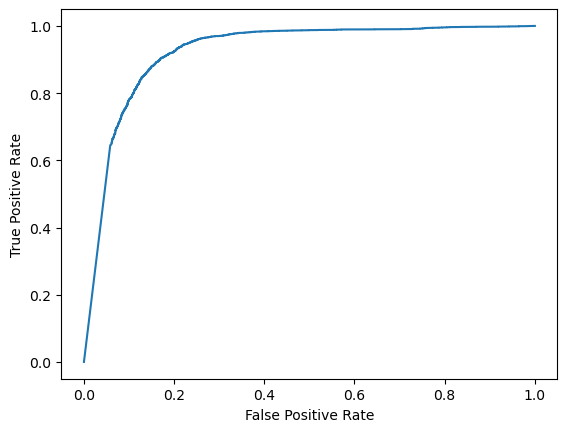

In [112]:
from sklearn.metrics import roc_curve
FPR,TPR,_ = roc_curve(y_train,model.predict_proba(X_train)[:,1])
plt.plot(FPR,TPR)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')

# Model evaluate on test Data

Accuracy : 83.0 %
Error Rate : 17.0 %
Recall or Sensitivity : 76.58102766798419 %
Precision : 88.97818599311137 %
F1 Score : 82.31545406266596 %


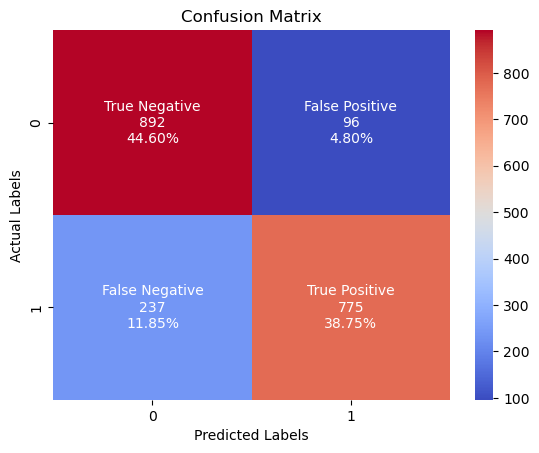

In [113]:
evaluate(model, X_test, y_test)

In [114]:
predict_test = model.predict(X_test)
print(classification_report(y_test,predict_test))

              precision    recall  f1-score   support

           0       0.79      0.90      0.84       988
           1       0.89      0.77      0.82      1012

    accuracy                           0.83      2000
   macro avg       0.84      0.83      0.83      2000
weighted avg       0.84      0.83      0.83      2000



# ROC curve

Text(0, 0.5, 'True Positive Rate')

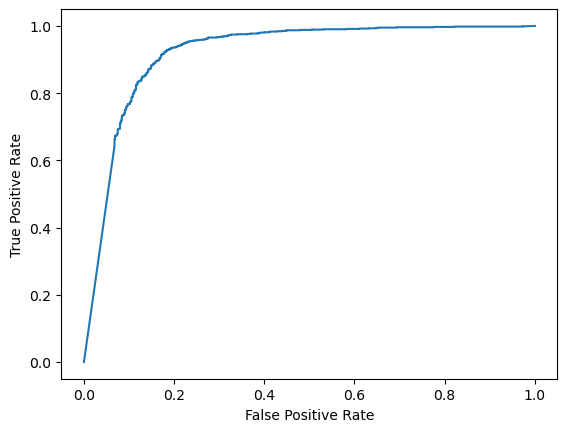

In [115]:
from sklearn.metrics import roc_curve
FPR,TPR,_ = roc_curve(y_test,model.predict_proba(X_test)[:,1])
plt.plot(FPR,TPR)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')

# Hyperparatmeter tunning to imporve Accuracy

In [116]:
from sklearn.model_selection import RepeatedStratifiedKFold

cv_method = RepeatedStratifiedKFold(n_splits=5,
                                    n_repeats=3,
                                    random_state=999)

In [117]:
nb_classifier = GaussianNB()

params_NB = {'var_smoothing': np.logspace(0,-9, num=100)}
gs_NB = GridSearchCV(estimator=nb_classifier,
                 param_grid=params_NB,
                 cv=cv_method,   # use any cross validation technique
                 verbose=1,
                 scoring='accuracy')
# Data_transformed = PowerTransformer().fit_transform(X_train)
gs_NB.fit(X_train, y_train)

# gs_NB.best_params_

Fitting 15 folds for each of 100 candidates, totalling 1500 fits


GridSearchCV(cv=RepeatedStratifiedKFold(n_repeats=3, n_splits=5, random_state=999),
             estimator=GaussianNB(),
             param_grid={'var_smoothing': array([1.00000000e+00, 8.11130831e-01, 6.57933225e-01, 5.33669923e-01,
       4.32876128e-01, 3.51119173e-01, 2.84803587e-01, 2.31012970e-01,
       1.87381742e-01, 1.51991108e-01, 1.23284674e-01, 1.00000000e-01,
       8.11130831e-02, 6.57933225e-02, 5...
       1.23284674e-07, 1.00000000e-07, 8.11130831e-08, 6.57933225e-08,
       5.33669923e-08, 4.32876128e-08, 3.51119173e-08, 2.84803587e-08,
       2.31012970e-08, 1.87381742e-08, 1.51991108e-08, 1.23284674e-08,
       1.00000000e-08, 8.11130831e-09, 6.57933225e-09, 5.33669923e-09,
       4.32876128e-09, 3.51119173e-09, 2.84803587e-09, 2.31012970e-09,
       1.87381742e-09, 1.51991108e-09, 1.23284674e-09, 1.00000000e-09])},
             scoring='accuracy', verbose=1)

In [118]:
results_NB = pd.DataFrame(gs_NB.cv_results_['params'])
results_NB['test_score'] = gs_NB.cv_results_['mean_test_score']

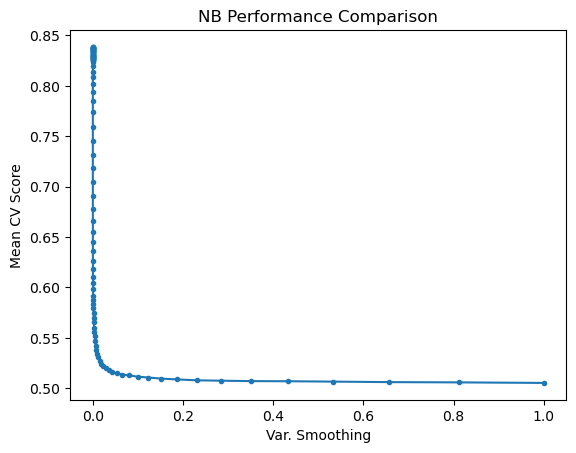

In [119]:
plt.plot(results_NB['var_smoothing'], results_NB['test_score'], marker = '.')
plt.xlabel('Var. Smoothing')
plt.ylabel("Mean CV Score")
plt.title("NB Performance Comparison")
plt.show()

In [120]:
gs_NB.best_params_

{'var_smoothing': 6.579332246575682e-07}

In [121]:
gs_NB.best_score_

0.8386666666666668

# Mode evaluation on train datasets

Accuracy : 84.0 %
Error Rate : 16.0 %
Recall or Sensitivity : 77.5827482447342 %
Precision : 89.42196531791907 %
F1 Score : 83.0827067669173 %


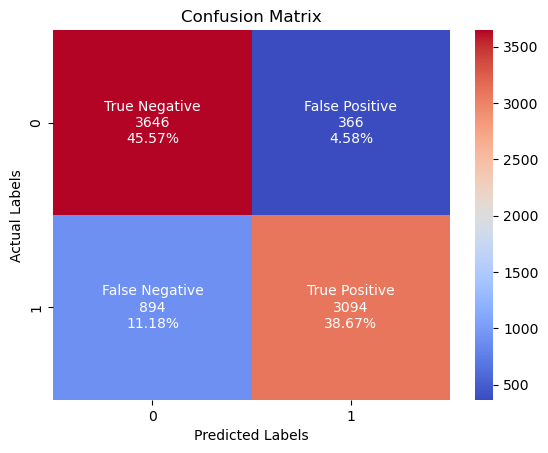

In [122]:
evaluate(gs_NB, X_train, y_train)

In [123]:
predict_train = gs_NB.predict(X_train)
print(classification_report(y_train,predict_train))

              precision    recall  f1-score   support

           0       0.80      0.91      0.85      4012
           1       0.89      0.78      0.83      3988

    accuracy                           0.84      8000
   macro avg       0.85      0.84      0.84      8000
weighted avg       0.85      0.84      0.84      8000



# ROC Curve

Text(0, 0.5, 'True Positive Rate')

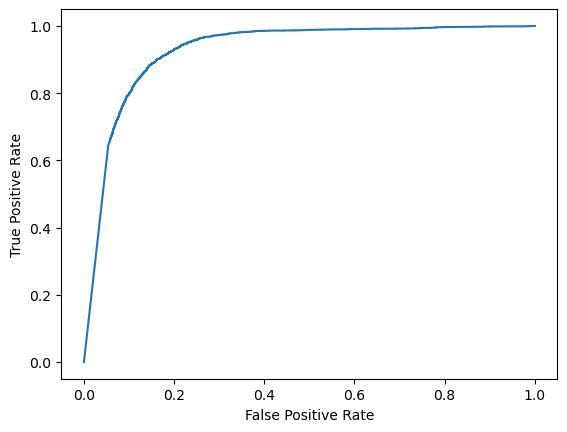

In [124]:
from sklearn.metrics import roc_curve
FPR,TPR,_ = roc_curve(y_train,gs_NB.predict_proba(X_train)[:,1])
plt.plot(FPR,TPR)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')

# Mode Evaluation On the test Dataset

Accuracy : 84.0 %
Error Rate : 16.0 %
Recall or Sensitivity : 79.05138339920948 %
Precision : 89.086859688196 %
F1 Score : 83.7696335078534 %


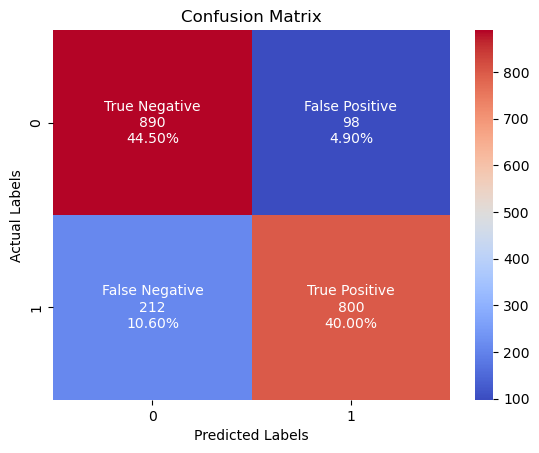

In [125]:
evaluate(gs_NB, X_test, y_test)

In [126]:
predict_test = gs_NB.predict(X_test)
print(classification_report(y_test,predict_test))

              precision    recall  f1-score   support

           0       0.81      0.90      0.85       988
           1       0.89      0.79      0.84      1012

    accuracy                           0.84      2000
   macro avg       0.85      0.85      0.84      2000
weighted avg       0.85      0.84      0.84      2000



# ROC curve

Text(0, 0.5, 'True Positive Rate')

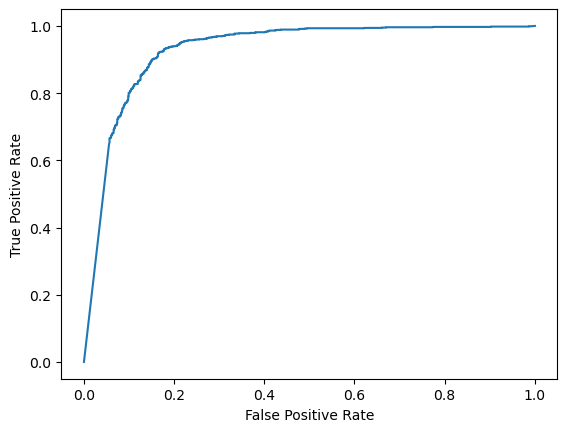

In [127]:
from sklearn.metrics import roc_curve
FPR,TPR,_ = roc_curve(y_test,gs_NB.predict_proba(X_test)[:,1])
plt.plot(FPR,TPR)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')

# The Kernel SVM

In [139]:
svc=SVC() 


# fit classifier to training set
model_svc = svc.fit(X_train,y_train)


# make predictions on test set
y_pred=svc.predict(X_test)


# compute and print accuracy score
print('Model accuracy score with default hyperparameters: {0:0.4f}'. format(accuracy_score(y_test, y_pred)))

Model accuracy score with default hyperparameters: 0.8680


# Model Evaluation

# train Data

Accuracy : 87.0 %
Error Rate : 13.0 %
Recall or Sensitivity : 89.1925777331996 %
Precision : 85.19760479041916 %
F1 Score : 87.14933235330147 %

Classification Report:
               precision    recall  f1-score   support

           0       0.89      0.85      0.87      4012
           1       0.85      0.89      0.87      3988

    accuracy                           0.87      8000
   macro avg       0.87      0.87      0.87      8000
weighted avg       0.87      0.87      0.87      8000



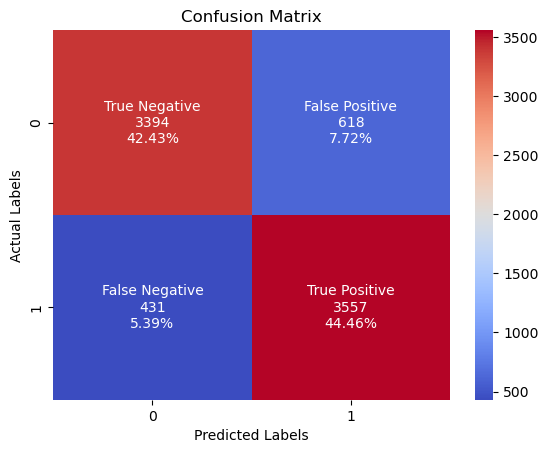

In [141]:
evaluate(model_svc, X_train, y_train)

predict_train = model_svc.predict(X_train)
print('\nClassification Report:\n',classification_report(y_train,predict_train))

# test data

Accuracy : 87.0 %
Error Rate : 13.0 %
Recall or Sensitivity : 89.82213438735178 %
Precision : 84.95327102803738 %
F1 Score : 87.31988472622479 %

Classification Report:
               precision    recall  f1-score   support

           0       0.89      0.84      0.86       988
           1       0.85      0.90      0.87      1012

    accuracy                           0.87      2000
   macro avg       0.87      0.87      0.87      2000
weighted avg       0.87      0.87      0.87      2000



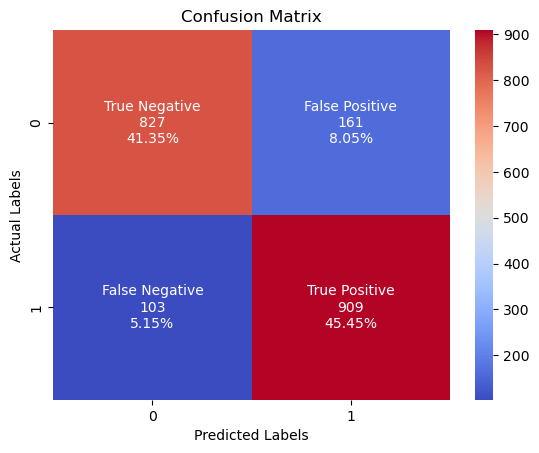

In [142]:
evaluate(model_svc, X_test, y_test)

predict_test = model_svc.predict(X_test)
print('\nClassification Report:\n',classification_report(y_test,predict_test))

# Logistic Regression

# Hyper Parameter Tuning

In [129]:
logModel = LogisticRegression()
param_grid = [
    {'penalty' : ['l1', 'l2', 'elasticnet', 'none'],
    'C' : np.logspace(-4, 4, 20),
    'solver' : ['lbfgs','newton-cg','liblinear','sag','saga'],
    'max_iter' : [10, 11,25, 50]
    }
]

clf = GridSearchCV(logModel, param_grid = param_grid, cv = 3, verbose=True, n_jobs=-1)
best_clf = clf.fit(X_train,y_train)

Fitting 3 folds for each of 1600 candidates, totalling 4800 fits


# Model Evaluation

# Training Datset

Accuracy : 89.0 %
Error Rate : 11.0 %
Recall or Sensitivity : 89.9949849548646 %
Precision : 88.70489372219475 %
F1 Score : 89.34528254916604 %

Classification Report:
               precision    recall  f1-score   support

           0       0.90      0.89      0.89      4012
           1       0.89      0.90      0.89      3988

    accuracy                           0.89      8000
   macro avg       0.89      0.89      0.89      8000
weighted avg       0.89      0.89      0.89      8000



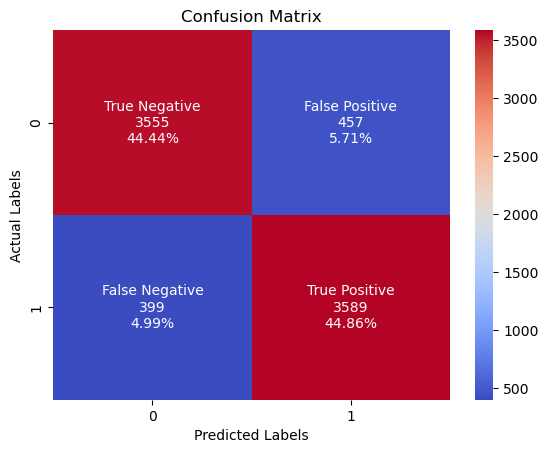

In [130]:
evaluate(best_clf, X_train, y_train)

predict_train = best_clf.predict(X_train)
print('\nClassification Report:\n',classification_report(y_train,predict_train))

# test Data

Accuracy : 89.0 %
Error Rate : 11.0 %
Recall or Sensitivity : 90.9090909090909 %
Precision : 87.87010506208213 %
F1 Score : 89.36376881981545 %

Classification Report:
               precision    recall  f1-score   support

           0       0.90      0.87      0.89       988
           1       0.88      0.91      0.89      1012

    accuracy                           0.89      2000
   macro avg       0.89      0.89      0.89      2000
weighted avg       0.89      0.89      0.89      2000



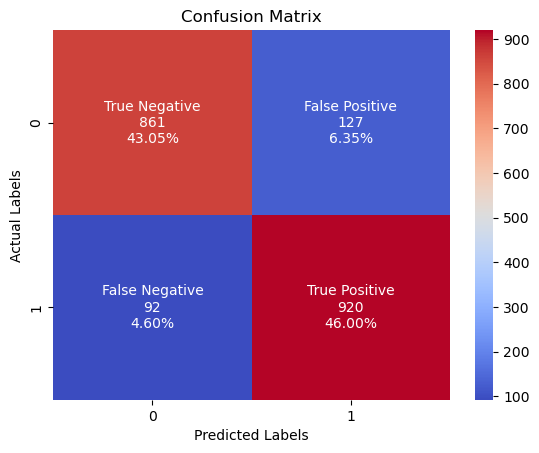

In [131]:
evaluate(best_clf, X_test, y_test)

predict_test = best_clf.predict(X_test)
print('\nClassification Report:\n',classification_report(y_test,predict_test))

# Ensemble Technique:

In [143]:
estimator = []
estimator.append(('Support Vector Classifier', model_svc))
estimator.append(('Decision Tree  Classifier', Model))
estimator.append(('Random Forest Classifier', best_grid))
estimator.append(('Logistic Regression Classifier', best_clf))
estimator.append(('Naive Bayes Classifier', gs_NB))
estimator

[('Support Vector Classifier', SVC()),
 ('Decision Tree  Classifier', DecisionTreeClassifier(max_depth=4)),
 ('Random Forest Classifier',
  RandomForestClassifier(max_depth=80, max_features=3, min_samples_leaf=3,
                         min_samples_split=12, n_estimators=300)),
 ('Logistic Regression Classifier',
  GridSearchCV(cv=3, estimator=LogisticRegression(), n_jobs=-1,
               param_grid=[{'C': array([1.00000000e-04, 2.63665090e-04, 6.95192796e-04, 1.83298071e-03,
         4.83293024e-03, 1.27427499e-02, 3.35981829e-02, 8.85866790e-02,
         2.33572147e-01, 6.15848211e-01, 1.62377674e+00, 4.28133240e+00,
         1.12883789e+01, 2.97635144e+01, 7.84759970e+01, 2.06913808e+02,
         5.45559478e+02, 1.43844989e+03, 3.79269019e+03, 1.00000000e+04]),
                            'max_iter': [10, 11, 25, 50],
                            'penalty': ['l1', 'l2', 'elasticnet', 'none'],
                            'solver': ['lbfgs', 'newton-cg', 'liblinear', 'sag',
        

# 1.Hard Voting:

In [158]:
from sklearn.model_selection import train_test_split, StratifiedKFold, cross_val_predict
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import classification_report
from imblearn.pipeline import Pipeline as imbPipe
from imblearn.over_sampling import SMOTE
from sklearn.ensemble import VotingClassifier
from sklearn.linear_model import LogisticRegression, SGDClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import LinearSVC, SVC
from sklearn.neighbors import KNeighborsClassifier

# Assuming X_train, X_test, y_train, y_test are defined

dct = DecisionTreeClassifier(random_state=42)
sgd = SGDClassifier(random_state=42)
log = LogisticRegression(random_state=42)
svm_rbf = SVC(kernel="rbf", random_state=42)
svm_lin = LinearSVC(loss="hinge")
knn = KNeighborsClassifier()

kfold = StratifiedKFold(n_splits=4, shuffle=True, random_state=42)

Voting_pipeline = imbPipe([
    ("scaler", StandardScaler()),
    ("smote", SMOTE(random_state=42, n_jobs=-1)),
    ("voting", VotingClassifier(estimators=[
        ("dct", dct),
        ("sgd", sgd),
        ("svm_rbf", svm_rbf),
        ("smv_lin", svm_lin),
        ("knn", knn),
        ("log", log)
    ], voting="hard", n_jobs=-1))
])

# Fit and evaluate on the training set
y_pred_train = cross_val_predict(Voting_pipeline, X_train, y_train, cv=kfold)
print("Classification Report on Training Set:\n", classification_report(y_train, y_pred_train))



Classification Report on Training Set:
               precision    recall  f1-score   support

           0       0.89      0.88      0.88      4012
           1       0.88      0.89      0.88      3988

    accuracy                           0.88      8000
   macro avg       0.88      0.88      0.88      8000
weighted avg       0.88      0.88      0.88      8000



# Evaluating Result on test Dataset

In [156]:
# Now, let's evaluate on the test set
Voting_pipeline.fit(X_train, y_train)
y_pred_test = Voting_pipeline.predict(X_test)
print("\nClassification Report on Test Set:\n", classification_report(y_test, y_pred_test))



Classification Report on Test Set:
               precision    recall  f1-score   support

           0       0.90      0.87      0.89       988
           1       0.88      0.91      0.89      1012

    accuracy                           0.89      2000
   macro avg       0.89      0.89      0.89      2000
weighted avg       0.89      0.89      0.89      2000



# 3.Averaging

In [164]:
def rmse_cv(model,X,y):
    rmse = np.sqrt(-cross_val_score(model,X,y,scoring="neg_mean_squared_error",cv=5))
    return rmse

In [165]:
models = [model_svc,
          Model,
          best_grid,
          gs_NB
         ]

names = ['Support Vector Classifier',
         'Decision Tree  Classifier',
         'Random Forest Classifier',
         'Naive Bayes Classifier']

In [166]:
for model,name in zip(models,names):
    score = rmse_cv(model,X_train,y_train)
    print("{}: {:.6f}, {:4f}".format(name,score.mean(),score.std()))

Support Vector Classifier: 0.364885, 0.021996
Decision Tree  Classifier: 0.371389, 0.008374
Random Forest Classifier: 0.343801, 0.007124
Fitting 15 folds for each of 100 candidates, totalling 1500 fits
Fitting 15 folds for each of 100 candidates, totalling 1500 fits
Fitting 15 folds for each of 100 candidates, totalling 1500 fits
Fitting 15 folds for each of 100 candidates, totalling 1500 fits
Fitting 15 folds for each of 100 candidates, totalling 1500 fits
Naive Bayes Classifier: 0.401167, 0.013774


# To define The average weight

In [167]:
class AverageWeight(BaseEstimator, RegressorMixin):
    def __init__(self,model,weight):
        self.model = model
        self.weight = weight

    def fit(self,X,y):
        self.models_ = [clone(x) for x in self.model]
        for model in self.models_:
            model.fit(X,y)
        return self

    def predict(self,X):
        w = list()
        pred = np.array([model.predict(X) for model in self.models_])

        # For every data point, single model prediction times weight, then add them together
        for data in range(pred.shape[1]):
            single = [pred[model,data]*weight for model,weight in zip(range(pred.shape[0]),self.weight)]
            w.append(np.sum(single))
        return w

# Using Four Models

In [168]:
# Assign weights to all the above 4 models
w1 = 0.12
w2 = 0.32
w3 = 0.21
w4 = 0.15

weight_avg = AverageWeight(model = [model_svc,           # Support Vector Classifier
                                    Model,           # Decision Tree Classifier
                                    best_grid,        # Random Forest Classifier
                                    gs_NB],           # Naive Bayes Classifier
                           weight=[w1,w2,w3,w4])
score = rmse_cv(weight_avg,X_train,y_train)
print(score.mean())

Fitting 15 folds for each of 100 candidates, totalling 1500 fits
Fitting 15 folds for each of 100 candidates, totalling 1500 fits
Fitting 15 folds for each of 100 candidates, totalling 1500 fits
Fitting 15 folds for each of 100 candidates, totalling 1500 fits
Fitting 15 folds for each of 100 candidates, totalling 1500 fits
0.3208282695804516


# Using Three Model

In [169]:
weight_avg = AverageWeight(model = [model_svc,           # Support Vector Classifier
                                    Model,           # Decision Tree Classifier
                                    best_grid],       # Random Forest Classifier
                           weight=[w1,w2,w3])
score = rmse_cv(weight_avg,X_train,y_train)
print(score.mean())

0.35990112005437214


# Using Two Model

In [170]:
weight_avg = AverageWeight(model = [best_grid,        # Random Forest Classifier
                                    Model],          # Decision Tree Classifier
                           weight=[w1,w2])
score = rmse_cv(weight_avg,X_train,y_train)
print(score.mean())

0.4514207259255394


# 4.Bagging

In [171]:
clf_array = [Model, best_grid]
for clf in clf_array:
    vanilla_scores = cross_val_score(clf, X, y, cv=10, n_jobs=-1)
    bagging_clf    = BaggingClassifier(clf,max_samples=0.4, max_features=10, random_state=0)
    bagging_scores = cross_val_score(bagging_clf, X, y, cv=10,n_jobs=-1)

    print ("Mean of: {1:.3f}, std: (+/-) {2:.3f} [{0}]".format(clf.__class__.__name__,vanilla_scores.mean(), vanilla_scores.std()))
    print ("Mean of: {1:.3f}, std: (+/-) {2:.3f} [Bagging {0}]\n".format(clf.__class__.__name__,bagging_scores.mean(), bagging_scores.std()))

Mean of: nan, std: (+/-) nan [DecisionTreeClassifier]
Mean of: nan, std: (+/-) nan [Bagging DecisionTreeClassifier]

Mean of: nan, std: (+/-) nan [RandomForestClassifier]
Mean of: nan, std: (+/-) nan [Bagging RandomForestClassifier]



# 5.Boosting

In [179]:
ada_boost = AdaBoostClassifier(random_state=1)
ada_boost.fit(X_train, y_train)

AdaBoostClassifier(random_state=1)

# Model evaluation on testing Dataset

Accuracy : 88.0 %
Error Rate : 12.0 %
Recall or Sensitivity : 88.73517786561264 %
Precision : 87.09990300678953 %
F1 Score : 87.90993636808616 %

Classification Report:
               precision    recall  f1-score   support

           0       0.88      0.87      0.87       988
           1       0.87      0.89      0.88      1012

    accuracy                           0.88      2000
   macro avg       0.88      0.88      0.88      2000
weighted avg       0.88      0.88      0.88      2000



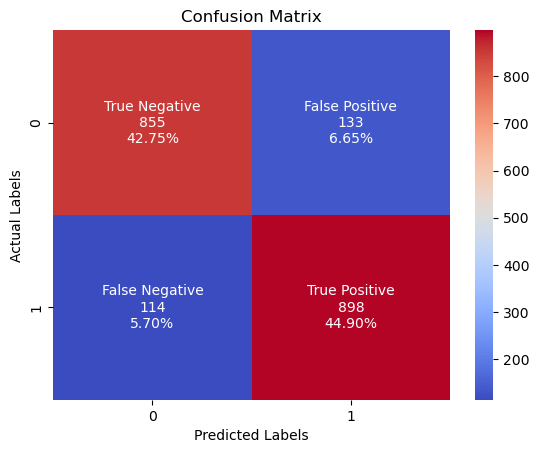

In [173]:
evaluate(ada_boost, X_test, y_test)
predict_test = ada_boost.predict(X_test)
print('\nClassification Report:\n',classification_report(y_test,predict_test))

In [182]:
P8 = ada_boost.predict(X_test)
Final_Data['Instant.Liking_ADB'] = P8
Final_Data.head()

In [191]:
# Comparing The Accuracy of all the classifiers

Text(0, 0.5, 'Percentage Accuracy achieved')

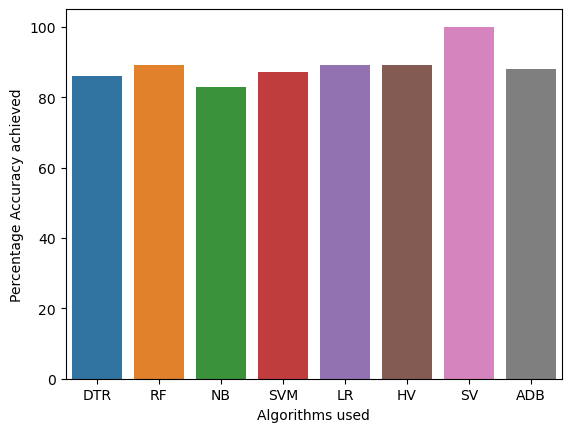

In [189]:
Algo = ['DTR','RF','NB','SVM','LR','HV','ADB']
Acur = [86,89,83,87,89,89,88]
sns.barplot(Algo,Acur)
plt.xlabel('Algorithms used')
plt.ylabel('Percentage Accuracy achieved')